# Predictive Modeling

## Exploratory Data Analysis

In [1]:
import json
import pickle
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from sklearn.model_selection import train_test_split

seed = 42

Loading data.

In [2]:
with open('ultimate_data_challenge.json') as f:
    data = json.load(f)

df = pd.DataFrame(data)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 12 columns):
city                      50000 non-null object
trips_in_first_30_days    50000 non-null int64
signup_date               50000 non-null object
avg_rating_of_driver      41878 non-null float64
avg_surge                 50000 non-null float64
last_trip_date            50000 non-null object
phone                     49604 non-null object
surge_pct                 50000 non-null float64
ultimate_black_user       50000 non-null bool
weekday_pct               50000 non-null float64
avg_dist                  50000 non-null float64
avg_rating_by_driver      49799 non-null float64
dtypes: bool(1), float64(6), int64(1), object(4)
memory usage: 4.2+ MB


In [4]:
df.head()

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver
0,King's Landing,4,2014-01-25,4.7,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0
2,Astapor,3,2014-01-06,4.3,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0
3,King's Landing,9,2014-01-10,4.6,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9
4,Winterfell,14,2014-01-27,4.4,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9


In [5]:
df.tail()

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver
49995,King's Landing,0,2014-01-25,5.0,1.0,2014-06-05,iPhone,0.0,False,100.0,5.63,4.2
49996,Astapor,1,2014-01-24,NaN,1.0,2014-01-25,iPhone,0.0,False,0.0,0.00,4.0
49997,Winterfell,0,2014-01-31,5.0,1.0,2014-05-22,Android,0.0,True,100.0,3.86,5.0
49998,Astapor,2,2014-01-14,3.0,1.0,2014-01-15,iPhone,0.0,False,100.0,4.58,3.5
49999,Astapor,0,2014-01-18,NaN,1.0,2014-04-20,Android,0.0,False,0.0,3.49,5.0


Converting date strings to datetime objects.

In [6]:
df['last_trip_date'] = pd.to_datetime(df['last_trip_date'])
df['signup_date'] = pd.to_datetime(df['signup_date'])

Labeling data, both as retained and long_term_retained.

In [7]:
def num_months_between(date_1, date_2):
    '''
    Returns the number of months between :param date_2: and :param date_1: without including days. 
    Examples: num_months_between('2014-03-18', '2014-06-18') ==> 3
              num_months_between('2014-03-18', '2014-06-09') ==> 3
              num_months_between('2014-03-18', '2014-06-29') ==> 3
              num_months_between('2014-07-18', '2016-06-18') ==> 23
    
    :param date_1: datetime, representing the starting date of the interval
    :param date_2: datetime, representing the ending date of the interval
    
    ---> int, number of months inbetween :param date_2: and :param date_1:
    '''
    
    return ((date_2.year - date_1.year) * 12) + (date_2.month - date_1.month)

def test_function(f):
    from datetime import date
    date_1s = ['2012-11-24', '2012-12-13', '2014-01-20', '2011-09-09']
    months_betweens = [6, 10, 2, 15]
    date_2s = ['2013-05-24', '2013-10-16', '2014-03-10', '2012-12-09']
    assert (len(date_1s) == len(date_2s) == len(months_betweens))
    for i in range(len(date_1s)):
        assert (f(date.fromisoformat(date_1s[i]), date.fromisoformat(date_2s[i])) == months_betweens[i])
    return None

test_function(num_months_between)

In [8]:
def lt_retained(signup_date, last_trip_date):
    '''
    Returns True if the customer is considered long-term retained. This is defined by the customer being active
    (taking trip) within the 6th month after the customers sign-up date, or later. Returns False otherwise.
    
    :param signup_date: customers sign-up date
    :param last_trip_date: date of the customers most recent trip (activity)
    
    ---> bool, labeling if the customer is long-term retained
    '''
    
    month_of_last_activity = num_months_between(signup_date, last_trip_date)
    if 6 <= month_of_last_activity:
        retained = True
    else:
        retained = False
    return retained

def test_function(f):
    from datetime import date
    date_1s = ['2012-11-24', '2012-12-13', '2014-01-20', '2011-09-09']
    labels = [True, True, False, True]
    date_2s = ['2013-05-24', '2013-10-16', '2014-03-10', '2012-12-09']
    assert (len(date_1s) == len(date_2s) == len(labels))
    for i in range(len(date_1s)):
        assert (f(date.fromisoformat(date_1s[i]), date.fromisoformat(date_2s[i])) == labels[i])
    return None

test_function(lt_retained)

In [9]:
df['retained'] = (df['trips_in_first_30_days'] > 0)
df['long_term_retained'] = df.apply(lambda d: lt_retained(d['signup_date'], d['last_trip_date']), axis=1)

In [10]:
df.head()

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver,retained,long_term_retained
0,King's Landing,4,2014-01-25,4.7,1.10,2014-06-17,iPhone,15.4,True,46.2,3.67,5.0,True,False
1,Astapor,0,2014-01-29,5.0,1.00,2014-05-05,Android,0.0,False,50.0,8.26,5.0,False,False
2,Astapor,3,2014-01-06,4.3,1.00,2014-01-07,iPhone,0.0,False,100.0,0.77,5.0,True,False
3,King's Landing,9,2014-01-10,4.6,1.14,2014-06-29,iPhone,20.0,True,80.0,2.36,4.9,True,False
4,Winterfell,14,2014-01-27,4.4,1.19,2014-03-15,Android,11.8,False,82.4,3.13,4.9,True,False


In [11]:
df.tail()

,city,trips_in_first_30_days,signup_date,avg_rating_of_driver,avg_surge,last_trip_date,phone,surge_pct,ultimate_black_user,weekday_pct,avg_dist,avg_rating_by_driver,retained,long_term_retained
49995,King's Landing,0,2014-01-25,5.0,1.0,2014-06-05,iPhone,0.0,False,100.0,5.63,4.2,False,False
49996,Astapor,1,2014-01-24,NaN,1.0,2014-01-25,iPhone,0.0,False,0.0,0.00,4.0,True,False
49997,Winterfell,0,2014-01-31,5.0,1.0,2014-05-22,Android,0.0,True,100.0,3.86,5.0,False,False
49998,Astapor,2,2014-01-14,3.0,1.0,2014-01-15,iPhone,0.0,False,100.0,4.58,3.5,True,False
49999,Astapor,0,2014-01-18,NaN,1.0,2014-04-20,Android,0.0,False,0.0,3.49,5.0,False,False


### Analysis

Plotting the distribution of retained status.

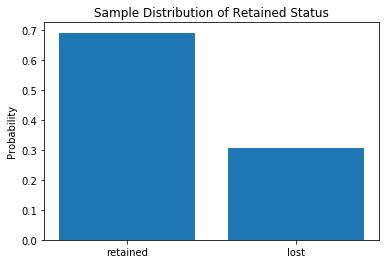

Number of retained customers: 34610
Number of lost customers: 15390
Sample size: 50000
Probability of retaining a customer: 0.6922
Probability of lossing a customer: 0.3078


In [12]:
data_to_plot = df['retained'].map(lambda l: 'retained' if l else 'lost')
counts = data_to_plot.value_counts()
distr = data_to_plot.value_counts(normalize=True)

fig, ax = plt.subplots()
ax.bar(distr.index, distr)
ax.set_title('Sample Distribution of Retained Status')
ax.set_ylabel('Probability')
plt.show()

print('Number of retained customers: {}'.format(counts['retained']))
print('Number of lost customers: {}'.format(counts['lost']))
print('Sample size: {}'.format(sum(counts)))
print('Probability of retaining a customer: {}'.format(distr['retained']))
print('Probability of lossing a customer: {}'.format(distr['lost']))

Plotting the distribution of long-term retained status.

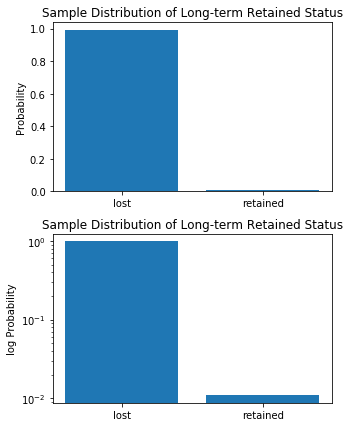

Number of long-term retained customers: 548
Number of lost customers: 49452
Sample size: 50000
Probability of long-term retaining a customer: 0.01096
Probability of lossing a customer: 0.98904


In [13]:
data_to_plot = df['long_term_retained'].map(lambda l: 'retained' if l else 'lost')
counts = data_to_plot.value_counts()
distr = data_to_plot.value_counts(normalize=True)


fig, ax = plt.subplots(2, figsize=(5, 7))
fig.subplots_adjust(hspace=0.25)

ax[0].bar(distr.index, distr)
ax[0].set_title('Sample Distribution of Long-term Retained Status')
ax[0].set_ylabel('Probability')

ax[1].bar(distr.index, distr, log=True)
ax[1].set_title('Sample Distribution of Long-term Retained Status')
ax[1].set_ylabel('log Probability')

plt.show()

print('Number of long-term retained customers: {}'.format(counts['retained']))
print('Number of lost customers: {}'.format(counts['lost']))
print('Sample size: {}'.format(sum(counts)))
print('Probability of long-term retaining a customer: {}'.format(distr['retained']))
print('Probability of lossing a customer: {}'.format(distr['lost']))

Testing if any of our categorical variables correlate with long-term retained status. Using chi squared correlation test which assumes a null hypothesis of non correlation between the two variables being tested. We assume a significance value of 0.05

In [14]:
def test_correlation(alpha, var_1, var_2, df):
    obs = pd.crosstab(df[var_1], df[var_2], dropna=True)
    chi2, p, dof, ex = chi2_contingency(obs)
    if p < alpha:
        print('P-value is: {}'.format(p))
        print('Null Hypothesis is reject, variables: {} and {} are correlated.'.format(var_1, var_2))
    return None

def test_corrlations_with(alpha, var_list, var, df):
    for fname in var_list:
        test_correlation(alpha, fname, var, df)

In [15]:
categorical_vars = ['city', 'phone', 'ultimate_black_user', 'retained']
significance = 0.05

test_corrlations_with(significance, categorical_vars, 'long_term_retained', df)

P-value is: 1.0012149071552444e-25
Null Hypothesis is reject, variables: city and long_term_retained are correlated.
P-value is: 7.200541438079046e-13
Null Hypothesis is reject, variables: phone and long_term_retained are correlated.
P-value is: 5.957490763704982e-10
Null Hypothesis is reject, variables: ultimate_black_user and long_term_retained are correlated.
P-value is: 2.6243679919674713e-05
Null Hypothesis is reject, variables: retained and long_term_retained are correlated.


It appears from the above tests that the correlations between long-term retained status and city, phone type, as well as ultimate_black_user are highly probable, with the order listed, in the order of highest to lowest probability. While the correlation between long-term retained status and retained status is less probable than the other correlations, it is still highly probable given its p-value.

Testing if any of the categorical variables that passed our tests, correlate with each other given the same significance value.

In [16]:
categorical_vars = ['city', 'phone', 'ultimate_black_user', 'retained']
significance = 0.05

for var in categorical_vars:
    print('Testing if {} is correlated with any of the other categorical variables.'.format(var))
    print()
    test_corrlations_with(significance, categorical_vars, var, df)
    print()

Testing if city is correlated with any of the other categorical variables.

P-value is: 0.0
Null Hypothesis is reject, variables: city and city are correlated.
P-value is: 8.96600385245811e-40
Null Hypothesis is reject, variables: phone and city are correlated.
P-value is: 2.8534741945532337e-33
Null Hypothesis is reject, variables: ultimate_black_user and city are correlated.
P-value is: 1.5586642695034676e-40
Null Hypothesis is reject, variables: retained and city are correlated.

Testing if phone is correlated with any of the other categorical variables.

P-value is: 8.96600385245811e-40
Null Hypothesis is reject, variables: city and phone are correlated.
P-value is: 0.0
Null Hypothesis is reject, variables: phone and phone are correlated.
P-value is: 1.2307367516356714e-60
Null Hypothesis is reject, variables: ultimate_black_user and phone are correlated.

Testing if ultimate_black_user is correlated with any of the other categorical variables.

P-value is: 2.8534741945532337e-33
N

From the above tests it appears that our only independent categorical variables are: retained status, and phone type.

Calculating correlation coefficients between non categorical variables.

In [17]:
df[['avg_rating_of_driver', 'avg_surge', 'surge_pct', 'weekday_pct', 'avg_dist', 'avg_rating_by_driver']].corr()

,avg_rating_of_driver,avg_surge,surge_pct,weekday_pct,avg_dist,avg_rating_by_driver
avg_rating_of_driver,1.000000,-0.026189,-0.003899,0.014630,0.034509,0.123175
avg_surge,-0.026189,1.000000,0.793582,-0.110071,-0.081491,0.010597
surge_pct,-0.003899,0.793582,1.000000,-0.144918,-0.104414,0.020103
weekday_pct,0.014630,-0.110071,-0.144918,1.000000,0.101652,0.020442
avg_dist,0.034509,-0.081491,-0.104414,0.101652,1.000000,0.080540
avg_rating_by_driver,0.123175,0.010597,0.020103,0.020442,0.080540,1.000000


From the above tests, it appears that variables average rating of driver, and surge percentage correlate the least.

#### Conclusions

From our above analysis the categorical variables that are both independent and correlate with our target variable, long-term retained status are: retained status, and phone type. The non categorical variables that are closest to being independent are: average rating of driver, and surge percentage. Since we want the features used in our modeling phase to be independent, but also correlate with the target variable, the features we will select will be: retained status, phone type, average rating of driver, and surge percentage.

### Preprocessing

Preprocessing will involve selecting the specified features, droping samples with NA values, one hot encoding the categorical variables that are not binary, and normalizing average rating of driver and surge percentage to help the optimizer converge quicker.

In [18]:
def preprocess(df):
    df = df[['retained', 'phone', 'avg_rating_of_driver', 'surge_pct', 'long_term_retained']]
    df = df.dropna()
    df['retained'] = df['retained'].map(lambda s: 1 if s else 0)
    df['phone'] = df['phone'].map(lambda s: 1 if s == 'iPhone' else 0)
    df['long_term_retained'] = df['long_term_retained'].map(lambda s: 1 if s else 0)
    df['avg_rating_of_driver'] = (df['avg_rating_of_driver'] - 1) / 4
    df['surge_pct'] = df['surge_pct'] / 100
    features = df[['retained', 'phone', 'avg_rating_of_driver', 'surge_pct']].values
    labels = df['long_term_retained'].values
    return features, labels

In [19]:
def preprocess_full(df):
    df = df[['trips_in_first_30_days', 'city', 'avg_surge', 'ultimate_black_user', 'weekday_pct', 'avg_dist', 'avg_rating_by_driver', 'retained', 'phone', 'avg_rating_of_driver', 'surge_pct', 'long_term_retained']]
    df = df.dropna()
    df = pd.concat([df, pd.get_dummies(df['city'], prefix='city')], axis=1).drop(['city'], axis=1)
    df['retained'] = df['retained'].map(lambda s: 1 if s else 0)
    df['phone'] = df['phone'].map(lambda s: 1 if s == 'iPhone' else 0)
    df['long_term_retained'] = df['long_term_retained'].map(lambda s: 1 if s else 0)
    df['ultimate_black_user'] = df['ultimate_black_user'].map(lambda s: 1 if s else 0)
    
    df['avg_rating_of_driver'] = (df['avg_rating_of_driver'] - 1) / 4
    df['avg_rating_by_driver'] = (df['avg_rating_by_driver'] - 1) / 4
    df['surge_pct'] = df['surge_pct'] / 100
    df['weekday_pct'] = df['weekday_pct'] / 100
    fnames = list(df.columns)
    fnames.remove('long_term_retained')
    features = df[fnames].values
    labels = df['long_term_retained'].values
    return features, labels

In [29]:
df.info()
print(max(df['avg_surge']))
print(min(df['avg_surge']))
print(max(df['avg_dist']))
print(min(df['avg_dist']))
df[['avg_surge', 'avg_dist']].head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 14 columns):
city                      50000 non-null object
trips_in_first_30_days    50000 non-null int64
signup_date               50000 non-null datetime64[ns]
avg_rating_of_driver      41878 non-null float64
avg_surge                 50000 non-null float64
last_trip_date            50000 non-null datetime64[ns]
phone                     49604 non-null object
surge_pct                 50000 non-null float64
ultimate_black_user       50000 non-null bool
weekday_pct               50000 non-null float64
avg_dist                  50000 non-null float64
avg_rating_by_driver      49799 non-null float64
retained                  50000 non-null bool
long_term_retained        50000 non-null bool
dtypes: bool(3), datetime64[ns](2), float64(6), int64(1), object(2)
memory usage: 4.3+ MB
8.0
1.0
160.96
0.0


,avg_surge,avg_dist
0,1.10,3.67
1,1.00,8.26
2,1.00,0.77
3,1.14,2.36
4,1.19,3.13


Preprocessing dataset.

In [33]:
X, y = preprocess(df)

Splitting dataset into train and test datasets.

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=seed, stratify=y)

Saving train and test datasets.

In [35]:
with open('train_dataset.pickle', 'wb') as f:
    train_dataset = (X_train, y_train)
    pickle.dump(train_dataset, f)

In [36]:
with open('test_dataset.pickle', 'wb') as f:
    test_dataset = (X_test, y_test)
    pickle.dump(test_dataset, f)

Preprocessing dataset to use all features.

In [38]:
X_full, y_full = preprocess_full(df)

Splitting full feature dataset into train and test datasets.

In [39]:
X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(X_full, y_full, train_size=0.75,
                                                                        random_state=seed, stratify=y_full)

Saving train and test full feature datasets.

In [40]:
with open('train_dataset_all_features.pickle', 'wb') as f:
    train_dataset_full = (X_train_full, y_train_full)
    pickle.dump(train_dataset_full, f)

In [41]:
with open('test_dataset_all_features.pickle', 'wb') as f:
    test_dataset_full = (X_test_full, y_test_full)
    pickle.dump(test_dataset_full, f)

### Analysis on Preprocessed dataset

Plotting the distribution of long-term retained status.

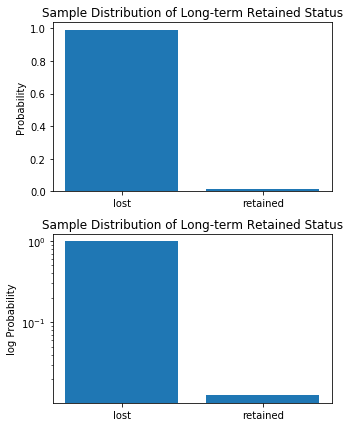

Number of long-term retained customers: 529
Number of lost customers: 41049
Sample size: 41578
Probability of long-term retaining a customer: 0.012723074702967916
Probability of lossing a customer: 0.987276925297032


In [42]:
data_to_plot = pd.Series(y).map(lambda l: 'retained' if l == 1 else 'lost')
counts = data_to_plot.value_counts()
distr = data_to_plot.value_counts(normalize=True)


fig, ax = plt.subplots(2, figsize=(5, 7))
fig.subplots_adjust(hspace=0.25)

ax[0].bar(distr.index, distr)
ax[0].set_title('Sample Distribution of Long-term Retained Status')
ax[0].set_ylabel('Probability')

ax[1].bar(distr.index, distr, log=True)
ax[1].set_title('Sample Distribution of Long-term Retained Status')
ax[1].set_ylabel('log Probability')

plt.show()

print('Number of long-term retained customers: {}'.format(counts['retained']))
print('Number of lost customers: {}'.format(counts['lost']))
print('Sample size: {}'.format(sum(counts)))
print('Probability of long-term retaining a customer: {}'.format(distr['retained']))
print('Probability of lossing a customer: {}'.format(distr['lost']))

From the above plots its clear that droping the null values in our dataset did effect the sample probability distribution of the target variable, although not by much.

## Modeling

### Baseline Model

The baseline model is the bare minimum model we can manually construct from just our Exploratory Data Analysis. This model will give us baseline that hopefully our trained models will beat. From our exploratory data analysis we have determined the probability of a random customer being long-termed retained is about 0.012723. From this we can describe our baseline model as a model that predicts a 0.012723 chance that the customer will be long-term retained for any customer sample that is fed to it.

Since we are dealing with a binary classification problem we can represent our baseline model as a variant of a logistic regression model where the input features do not matter:  
$$P(LTretained | x) = 0.012723 = p_{0} = \frac{1}{1 + e^{-(0 \cdot X + b)}}$$

where $X$ is defined to be the features of a sample fed to the model, $0$ is defined to be the zero tensor, $\cdot$ is defined to be the inner product, and $b$ the bias vector of the model.

Solving for the bias term we find: 

$$P(LTretained | x) = 0.012723 = p_{0} = \frac{1}{1 + e^{-b}}$$ which implies $$e^{-b} = \frac{1}{p_{0}} - 1$$

$$b = -\ln(\frac{1}{p_0} - 1)$$

This means our baseline model can be represented as a logistic regression model initialized with 0 weights and a bias term equal to $b$.

Restart kernel to clear GPU memory.

In [1]:
import os
import pickle
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

gpus = tf.config.experimental.list_physical_devices('GPU')
visible_gpus = tf.config.experimental.get_visible_devices('GPU')
print('GPUs: {}'.format(gpus))
print('Visible GPUs: {}'.format(visible_gpus))

if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=5000)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)      
        
# Setting Random Seeds
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Visible GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
1 Physical GPUs, 1 Logical GPUs


In [2]:
with open('train_dataset.pickle', 'rb') as f:
    X_train, y_train = pickle.load(f)

In [3]:
with open('test_dataset.pickle', 'rb') as f:
    X_test, y_test = pickle.load(f)

In [4]:
def build_compiled_model(build_model, model_name, hparams, metrics, run_number):
    hparam_version = hparams['version']
    loss = hparams['loss']
    optimizer = hparams['optimizer']
    model_parameters = hparams['model_parameters']
    model = build_model(**model_parameters)
    path_to_ckpt = os.path.join('logs', 'models', model_name, '_'.join(['version', str(hparam_version)]),
                               'runs', str(run_number), 'checkpoints')
    if os.path.exists(path_to_ckpt):
        latest = tf.train.latest_checkpoint(path_to_ckpt)
        model.load_weights(latest)
        print('Restored model from: {}'.format(latest))  
    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    return model

In [5]:
def plot_metric(history, metric):
    name = metric.replace("_"," ").capitalize()
    fig, ax = plt.subplots()
    ax.plot(history.history[metric], label='Train')
    if 'val_' + metric in history.history:
        ax.plot(history.epoch, history.history['val_' + metric], linestyle="--", label='Val')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(name)
    ax.legend()
    plt.show()
    return None

def print_metric(metrics_values, metric_idx, name):
    if isinstance(metrics_values, list):
        metric_val = metrics_values[metric_idx]
    else: 
        metric_val = metrics_values
    return print(name.format(metric_val))
    
def plot_print_metrics(history, metrics_train, metrics_val, metrics_names):
    for metric_idx, metric_name in enumerate(metrics_names):
        if history != None:
            plot_metric(history, metric_name)
        name_train = metric_name.replace('_', ' ').capitalize() + ' on train dataset: {}'
        print_metric(metrics_train, metric_idx, name_train)
        name_val = metric_name.replace('_', ' ').capitalize() + ' on validation dataset: {}'
        print_metric(metrics_val, metric_idx, name_val)
    return None

Defining model.

In [6]:
def baseline_model(output_bias_init=None):
    if output_bias_init is not None:
        output_bias_init = tf.keras.initializers.Constant(output_bias_init)
    inputs = tf.keras.Input(shape=(4,), name='input_features')
    outputs = tf.keras.layers.Dense(1, activation='sigmoid', kernel_initializer='zeros',
                                    bias_initializer=output_bias_init)(inputs)
    model = tf.keras.Model(inputs, outputs, name='baseline_model')
    return model

Building baseline model.

In [7]:
# Calculating Output Bias
p_0 = 529/41578
b = -np.log(((1 / p_0) - 1))

# Defining Hyperparameters
model_params = {'output_bias_init': b}
LOSS = tf.keras.losses.BinaryCrossentropy()
OPTIMIZER = tf.keras.optimizers.SGD()
training_params = None
model_version = 0
hyperparameters = {'model_parameters': model_params, 'training_parameters': training_params,
                   'loss': LOSS, 'optimizer': OPTIMIZER, 'version': None}

# Defining Metrics
METRICS = [tf.keras.metrics.TruePositives(name='TP'), tf.keras.metrics.FalsePositives(name='FP'),
           tf.keras.metrics.TrueNegatives(name='TN'), tf.keras.metrics.FalseNegatives(name='FN'),
           tf.keras.metrics.BinaryAccuracy(name='accuracy'), tf.keras.metrics.Precision(name='precision'),
           tf.keras.metrics.Recall(name='recall'), tf.keras.metrics.AUC(name='PR_AUC', curve='PR'),
           tf.keras.metrics.AUC(name='ROC_AUC', curve='ROC')]

In [8]:
# Building Baseline Model
baseline_m = build_compiled_model(baseline_model, 'baseline_model', hyperparameters, METRICS, run_number=None)

Evaluating Baseline Model.

In [9]:
# Evaluating Baseline Model
results_train = baseline_m.evaluate(X_train, y_train, batch_size=64, verbose=0)
results_test = baseline_m.evaluate(X_test, y_test, batch_size=64, verbose=0)

plot_print_metrics(None, results_train, results_test, baseline_m.metrics_names)

Loss on train dataset: 0.06820536222224292
Loss on validation dataset: 0.06806226983682546
Tp on train dataset: 0.0
Tp on validation dataset: 0.0
Fp on train dataset: 0.0
Fp on validation dataset: 0.0
Tn on train dataset: 30786.0
Tn on validation dataset: 10263.0
Fn on train dataset: 397.0
Fn on validation dataset: 132.0
Accuracy on train dataset: 0.9872686862945557
Accuracy on validation dataset: 0.9873015880584717
Precision on train dataset: 0.0
Precision on validation dataset: 0.0
Recall on train dataset: 0.0
Recall on validation dataset: 0.0
Pr auc on train dataset: 0.012731296010315418
Pr auc on validation dataset: 0.012698412872850895
Roc auc on train dataset: 0.5
Roc auc on validation dataset: 0.5


### Logistic Regression Model

Restart kernel to clear GPU memory.

In [10]:
import os
import pickle
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

gpus = tf.config.experimental.list_physical_devices('GPU')
visible_gpus = tf.config.experimental.get_visible_devices('GPU')
print('GPUs: {}'.format(gpus))
print('Visible GPUs: {}'.format(visible_gpus))

if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=5000)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)      
        
# Setting Random Seed
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Visible GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
1 Physical GPUs, 1 Logical GPUs


In [2]:
def gen_print_model_stats(model, path, model_name):
    m = model()
    path = os.path.join(path, model_name)
    if not os.path.exists(path):
        os.makedirs(path)
    fname = os.path.join(path, model_name)
    tf.keras.utils.plot_model(m, fname + '.png', show_shapes=True, expand_nested=True)
    tf.keras.backend.clear_session()
    return m.summary()

Defining model.

In [3]:
def logistic_regression(output_kernel_init=None, output_bias_init=None):
    if output_bias_init is not None:
        output_bias_init = tf.keras.initializers.Constant(output_bias_init)
    inputs = tf.keras.Input(shape=(4,), name='input_features')
    outputs = tf.keras.layers.Dense(1, activation='sigmoid',
                                    kernel_initializer=output_kernel_init,
                                    bias_initializer=output_bias_init)(inputs)
    model = tf.keras.Model(inputs, outputs, name='logistic_regression_model')
    return model

gen_print_model_stats(logistic_regression, os.path.join('logs', 'models'), 'log_reg_model')

Model: "logistic_regression_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_features (InputLayer)  [(None, 4)]               0         
_________________________________________________________________
dense (Dense)                (None, 1)                 5         
Total params: 5
Trainable params: 5
Non-trainable params: 0
_________________________________________________________________


Graph of Model:
![title](logs/models/log_reg_model/log_reg_model.png)

#### Unit Testing Model

Restart kernel to clear GPU memory.

In [19]:
import os
import pickle
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

gpus = tf.config.experimental.list_physical_devices('GPU')
visible_gpus = tf.config.experimental.get_visible_devices('GPU')
print('GPUs: {}'.format(gpus))
print('Visible GPUs: {}'.format(visible_gpus))

if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=5000)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)
        
# Setting Random Seed
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Visible GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Virtual devices cannot be modified after being initialized


In [2]:
with open('train_dataset.pickle', 'rb') as f:
    X_train, y_train = pickle.load(f)

In [4]:
def build_compiled_model(build_model, model_name, hparams, metrics, run_number):
    hparam_version = hparams['version']
    loss = hparams['loss']
    optimizer = hparams['optimizer']
    model_parameters = hparams['model_parameters']
    model = build_model(**model_parameters)
    path_to_ckpt = os.path.join('logs', 'models', model_name, '_'.join(['version', str(hparam_version)]),
                               'runs', str(run_number), 'checkpoints')
    if os.path.exists(path_to_ckpt):
        latest = tf.train.latest_checkpoint(path_to_ckpt)
        model.load_weights(latest)
        print('Restored model from: {}'.format(latest))  
    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    return model

In [5]:
def plot_errors(predictions, true_labels, title):
    fig, ax = plt.subplots()
    err = true_labels - predictions
    ax.plot(err, 'bo')
    ax.set_xlabel('Sample')
    ax.set_ylabel('Error')
    ax.set_title(title)
    plt.show()
    return None

def plot_metric(history, metric):
    name = metric.replace("_"," ").capitalize()
    fig, ax = plt.subplots()
    ax.plot(history.history[metric], label='Train')
    if 'val_' + metric in history.history:
        ax.plot(history.epoch, history.history['val_' + metric], linestyle="--", label='Val')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(name)
    ax.legend()
    plt.show()
    return None

def print_metric(metrics_values, metric_idx, name):
    if isinstance(metrics_values, list):
        metric_val = metrics_values[metric_idx]
    else: 
        metric_val = metrics_values
    return print(name.format(metric_val))
    
def plot_print_metrics(history, metrics_train, metrics_val, metrics_names):
    for metric_idx, metric_name in enumerate(metrics_names):
        if history != None:
            plot_metric(history, metric_name)
        name_train = metric_name.replace('_', ' ').capitalize() + ' on train dataset: {}'
        print_metric(metrics_train, metric_idx, name_train)
        name_val = metric_name.replace('_', ' ').capitalize() + ' on validation dataset: {}'
        print_metric(metrics_val, metric_idx, name_val)
    return None

In [6]:
def sample_dataset(X, y, sample_size, replace=False):
    sample_idxs = np.random.choice(len(y), size=sample_size, replace=False)
    return X[sample_idxs], y[sample_idxs]

def null_features(X):
    return np.zeros(X.shape)

def baseline_model(output_bias_init=None):
    if output_bias_init is not None:
        output_bias_init = tf.keras.initializers.Constant(output_bias_init)
    inputs = tf.keras.Input(shape=(4,), name='input_features')
    outputs = tf.keras.layers.Dense(1, activation='sigmoid', kernel_initializer='zeros',
                                    bias_initializer=output_bias_init)(inputs)
    model = tf.keras.Model(inputs, outputs, name='baseline_model')
    return model

Defining model.

In [7]:
def logistic_regression(output_kernel_init=None, output_bias_init=None):
    if output_bias_init is not None:
        output_bias_init = tf.keras.initializers.Constant(output_bias_init)
    inputs = tf.keras.Input(shape=(4,), name='input_features')
    outputs = tf.keras.layers.Dense(1, activation='sigmoid',
                                    kernel_initializer=output_kernel_init,
                                    bias_initializer=output_bias_init)(inputs)
    model = tf.keras.Model(inputs, outputs, name='logistic_regression_model')
    return model

Testing baseline equivalence of model. Passing this test implies that when the model's output kernel, and bias are successfully initialized, the untrained model should be equivalent to the baseline model, which is an important assumption to verify.

In [8]:
def test_baseline_equivalence(model, baseline_model, batch_size, X, y):
    print('Testing if the untrained model when initialized properly is equivalent to the baseline model')
    p_0 = 529/41578
    b = -np.log(((1 / p_0) - 1))
    LOSS = tf.keras.losses.BinaryCrossentropy()
    OPTIMIZER = tf.keras.optimizers.SGD()
    METRICS = [tf.keras.metrics.TruePositives(name='TP'), tf.keras.metrics.FalsePositives(name='FP'),
               tf.keras.metrics.TrueNegatives(name='TN'), tf.keras.metrics.FalseNegatives(name='FN'),
               tf.keras.metrics.BinaryAccuracy(name='accuracy'), tf.keras.metrics.Precision(name='precision'),
               tf.keras.metrics.Recall(name='recall'), tf.keras.metrics.AUC(name='PR_AUC', curve='PR'),
               tf.keras.metrics.AUC(name='ROC_AUC', curve='ROC')]
    
    baseline_hparams = {'model_parameters': {'output_bias_init': b}, 'training_parameters': None,
                        'loss': LOSS, 'optimizer': OPTIMIZER, 'version': None}
    baseline_m = build_compiled_model(baseline_model, 'baseline_model', baseline_hparams, METRICS, run_number=None)
    baseline_results = baseline_m.evaluate(X, y, batch_size=batch_size, verbose=0)
    
    model_parameters = {'output_kernel_init': 'zeros', 'output_bias_init': b}
    m_hparams = {'model_parameters': model_parameters, 'training_parameters': None,
                 'loss': LOSS, 'optimizer': OPTIMIZER, 'version': None}
    m = build_compiled_model(model, 'model', m_hparams, METRICS, run_number=None)
    m_results = m.evaluate(X, y, batch_size=batch_size, verbose=0)
    
    assert m_results == baseline_results
    
    return print('Passed')

In [9]:
test_baseline_equivalence(logistic_regression, baseline_model, batch_size=64, X=X_train, y=y_train)

Testing if the untrained model when initialized properly is equivalent to the baseline model
Passed


Testing if the model, when trained on features that are all null, performs worse than when trained on actual data.

building models.

In [10]:
# Calculating Output Bias
p_0 = 529/41578
b = -np.log(((1 / p_0) - 1))

# Defining Hyperparameters
model_params = {'output_bias_init': b}
LOSS = tf.keras.losses.BinaryCrossentropy()
OPTIMIZER = tf.keras.optimizers.SGD()
training_params = {'batch_size': 32, 'epochs': 100}
model_version = None
hyperparameters = {'model_parameters': model_params, 'training_parameters': training_params,
                   'loss': LOSS, 'optimizer': OPTIMIZER, 'version': model_version}

# Defining Metrics
METRICS = [tf.keras.metrics.TruePositives(name='TP'), tf.keras.metrics.FalsePositives(name='FP'),
           tf.keras.metrics.TrueNegatives(name='TN'), tf.keras.metrics.FalseNegatives(name='FN'),
           tf.keras.metrics.BinaryAccuracy(name='accuracy'), tf.keras.metrics.Precision(name='precision'),
           tf.keras.metrics.Recall(name='recall'), tf.keras.metrics.AUC(name='PR_AUC', curve='PR'),
           tf.keras.metrics.AUC(name='ROC_AUC', curve='ROC')]

In [11]:
m_null = build_compiled_model(logistic_regression, 'model', hyperparameters, METRICS, run_number=None)
m_data = build_compiled_model(logistic_regression, 'model', hyperparameters, METRICS, run_number=None)

Training models.

In [12]:
X, y = sample_dataset(X_train, y_train, sample_size=32)
X_null = null_features(X)

In [13]:
history_null = m_null.fit(X_null, y, **hyperparameters['training_parameters'])

Train on 32 samples
Epoch 1/100
32/32 [==============================] - 1s 25ms/sample - loss: 0.0128 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 2/100
32/32 [==============================] - 0s 178us/sample - loss: 0.0128 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 3/100
32/32 [==============================] - 0s 180us/sample - loss: 0.0128 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 4/100
32/32 [==============================] - 0s 170us/sample - loss: 0.0128 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 5/100
32/32 [==============================] - 0s 1

Epoch 37/100
32/32 [==============================] - 0s 109us/sample - loss: 0.0127 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 38/100
32/32 [==============================] - 0s 107us/sample - loss: 0.0127 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 39/100
32/32 [==============================] - 0s 107us/sample - loss: 0.0127 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 40/100
32/32 [==============================] - 0s 112us/sample - loss: 0.0127 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 41/100
32/32 [==============================] - 0s 112us/sample - 

Epoch 73/100
32/32 [==============================] - 0s 109us/sample - loss: 0.0127 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 74/100
32/32 [==============================] - 0s 137us/sample - loss: 0.0127 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 75/100
32/32 [==============================] - 0s 139us/sample - loss: 0.0127 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 76/100
32/32 [==============================] - 0s 113us/sample - loss: 0.0127 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 77/100
32/32 [==============================] - 0s 111us/sample - 

In [14]:
history_data = m_data.fit(X, y, **hyperparameters['training_parameters'])

Train on 32 samples
Epoch 1/100
32/32 [==============================] - 0s 14ms/sample - loss: 0.0094 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 2/100
32/32 [==============================] - 0s 133us/sample - loss: 0.0094 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 3/100
32/32 [==============================] - 0s 131us/sample - loss: 0.0094 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 4/100
32/32 [==============================] - 0s 108us/sample - loss: 0.0094 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 5/100
32/32 [==============================] - 0s 1

Epoch 37/100
32/32 [==============================] - 0s 96us/sample - loss: 0.0093 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 38/100
32/32 [==============================] - 0s 106us/sample - loss: 0.0093 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 39/100
32/32 [==============================] - 0s 98us/sample - loss: 0.0093 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 40/100
32/32 [==============================] - 0s 99us/sample - loss: 0.0093 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 41/100
32/32 [==============================] - 0s 99us/sample - loss

Epoch 73/100
32/32 [==============================] - 0s 103us/sample - loss: 0.0092 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 74/100
32/32 [==============================] - 0s 102us/sample - loss: 0.0092 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 75/100
32/32 [==============================] - 0s 110us/sample - loss: 0.0092 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 76/100
32/32 [==============================] - 0s 104us/sample - loss: 0.0092 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 32.0000 - FN: 0.0000e+00 - accuracy: 1.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - AUC: 0.0000e+00
Epoch 77/100
32/32 [==============================] - 0s 103us/sample - 

Evaluating models.

In [15]:
results_null = m_null.evaluate(X, y, hyperparameters['training_parameters']['batch_size'], verbose=0)

In [16]:
results_data = m_data.evaluate(X, y, hyperparameters['training_parameters']['batch_size'], verbose=0)

In [17]:
assert results_null[0] > results_data[0]

Testing if model can overfit on a small sample size of data.

In [29]:
def overfit_small_sample(model, batch_size, epochs, X_small, y_small, verbose):
    print('Testing if model can overfit on a small sample of data')
    p_0 = 529/41578
    b = -np.log(((1 / p_0) - 1))
    LOSS = tf.keras.losses.BinaryCrossentropy()
    OPTIMIZER = tf.keras.optimizers.SGD()
    model_params = {'output_bias_init': b}
    training_params = {'batch_size': batch_size, 'epochs': epochs}
    hparams = {'model_parameters': model_params, 'training_parameters': training_params,
               'loss': LOSS, 'optimizer': OPTIMIZER, 'version': None}

    METRICS = [tf.keras.metrics.TruePositives(name='TP'), tf.keras.metrics.FalsePositives(name='FP'),
               tf.keras.metrics.TrueNegatives(name='TN'), tf.keras.metrics.FalseNegatives(name='FN'),
               tf.keras.metrics.BinaryAccuracy(name='accuracy'), tf.keras.metrics.Precision(name='precision'),
               tf.keras.metrics.Recall(name='recall'), tf.keras.metrics.AUC(name='PR_AUC', curve='PR'),
               tf.keras.metrics.AUC(name='ROC_AUC', curve='ROC')]
    
    m = build_compiled_model(model, 'model', hparams, METRICS, run_number=None)
    m_pred_untrained = m.predict(X_small, batch_size=batch_size) > 0.5
    m_history = m.fit(X_small, y_small, batch_size=batch_size, epochs=epochs, verbose=verbose)
    m_pred_trained = m.predict(X_small, batch_size=batch_size) > 0.5
    print()
    
    print('Plotting Error against Sample for Before Training, and After Training on the Small Dataset')
    plot_errors(m_pred_untrained, y_small, 'Before Training')
    plot_errors(m_pred_trained, y_small, 'After Training')
    print('Predicted probabilities after training: {}'.format(m.predict(X_small, batch_size=batch_size)))
    print()
    
    metrics = ['loss'] + list(map(lambda met: met.name, METRICS))
    for met in metrics:
        plot_metric(m_history, metric=met)
        
    return None

Testing if model can overfit on a small sample of data

Plotting Error against Sample for Before Training, and After Training on the Small Dataset


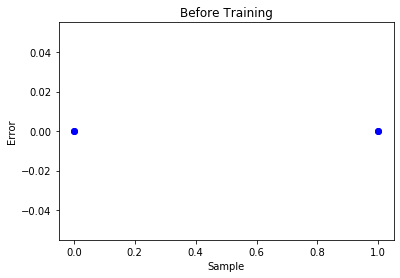

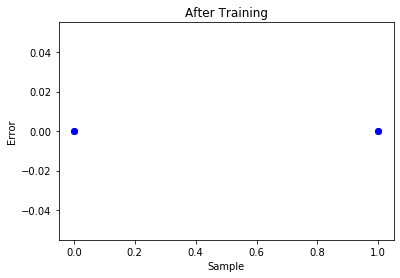

Predicted probabilities after training: [[0.00257274]
 [0.00173243]]



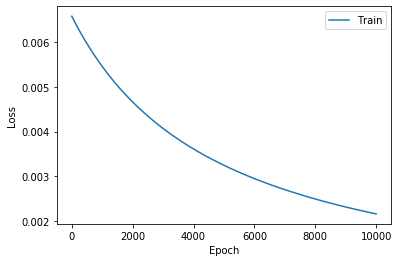

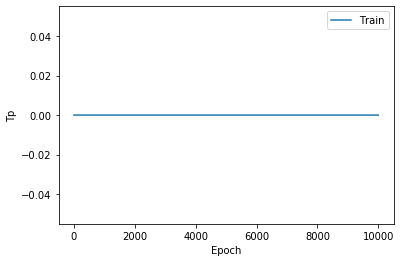

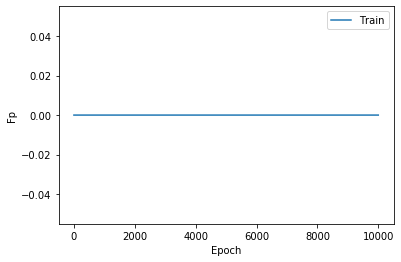

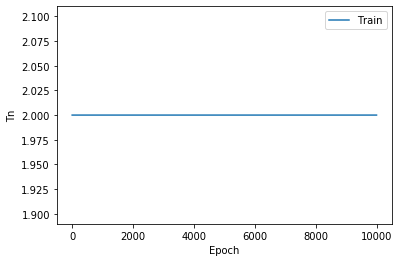

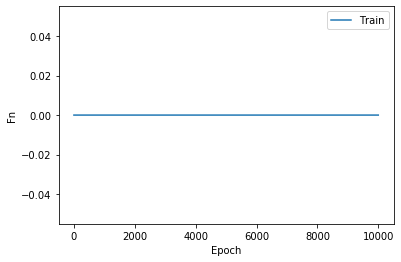

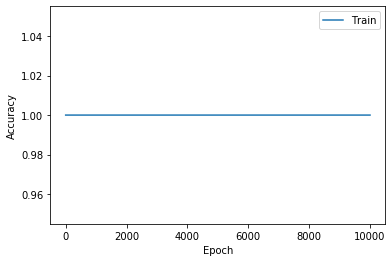

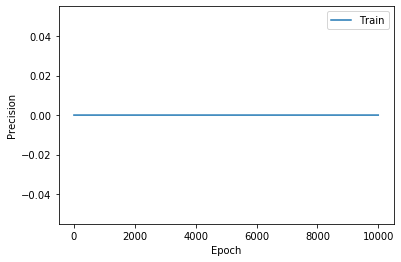

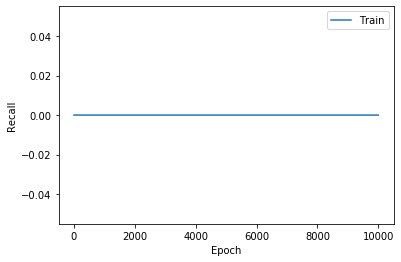

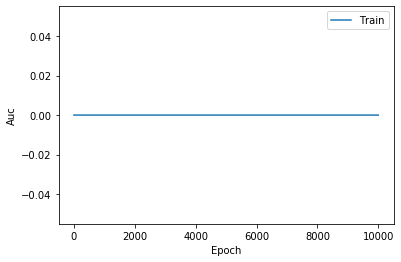

In [33]:
X_small, y_small = sample_dataset(X_train, y_train, sample_size=2)
overfit_small_sample(logistic_regression, batch_size=2, epochs=10000, X_small=X_small, y_small=y_small, verbose=0)

It appears our model when initialized properly is equivalent to the baseline model. It also appears that our model performs worse when trained on null data, and that it can overfit on a small sample size of data. Thus our model passes all three our sanity checks.

#### Evaluating Model

Restart kernel to clear GPU memory.

In [1]:
import os
import re
import pickle
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from sklearn.metrics import roc_curve, precision_recall_curve
from sklearn.model_selection import train_test_split

gpus = tf.config.experimental.list_physical_devices('GPU')
visible_gpus = tf.config.experimental.get_visible_devices('GPU')
print('GPUs: {}'.format(gpus))
print('Visible GPUs: {}'.format(visible_gpus))

if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=7000)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)      
        
# Setting Random Seed
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Visible GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
1 Physical GPUs, 1 Logical GPUs


In [2]:
with open('train_dataset.pickle', 'rb') as f:
    X, y = pickle.load(f)

In [3]:
def build_compiled_model(build_model, model_name, hparams, metrics, run_number):
    hparam_version = hparams['version']
    loss = hparams['loss']
    optimizer = hparams['optimizer']
    model_parameters = hparams['model_parameters']
    model = build_model(**model_parameters)
    path_to_ckpt = os.path.join('logs', 'models', model_name, '_'.join(['version', str(hparam_version)]),
                               'runs', str(run_number), 'checkpoints')
    if os.path.exists(path_to_ckpt):
        latest = tf.train.latest_checkpoint(path_to_ckpt)
        model.load_weights(latest)
        print('Restored model from: {}'.format(latest))  
    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    return model

In [4]:
def plot_errors(predictions, true_labels, title):
    fig, ax = plt.subplots()
    err = true_labels - predictions
    ax.plot(err, 'bo')
    ax.set_xlabel('Sample')
    ax.set_ylabel('Error')
    ax.set_title(title)
    plt.show()
    return None

def plot_metric(history, metric):
    name = metric.replace("_"," ").capitalize()
    fig, ax = plt.subplots()
    ax.plot(history.history[metric], label='Train')
    if 'val_' + metric in history.history:
        ax.plot(history.epoch, history.history['val_' + metric], linestyle="--", label='Val')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(name)
    ax.legend()
    plt.show()
    return None

def print_metric(metrics_values, metric_idx, name):
    if isinstance(metrics_values, list):
        metric_val = metrics_values[metric_idx]
    else: 
        metric_val = metrics_values
    return print(name.format(metric_val))
    
def plot_print_metrics(history, metrics_train, metrics_val, metrics_names):
    for metric_idx, metric_name in enumerate(metrics_names):
        if history != None:
            plot_metric(history, metric_name)
        name_train = metric_name.replace('_', ' ').capitalize() + ' on train dataset: {}'
        print_metric(metrics_train, metric_idx, name_train)
        name_val = metric_name.replace('_', ' ').capitalize() + ' on validation dataset: {}'
        print_metric(metrics_val, metric_idx, name_val)
    return None

def plot_roc_curve(labels, predictions):
    fpr, tpr, thresholds = roc_curve(y_val, predictions)
    fig, ax = plt.subplots()
    ax.plot([0, 1], [0, 1], 'k--', label='baseline')
    ax.plot(fpr, tpr, label='model')
    ax.set_xlabel('False positive rate')
    ax.set_ylabel('True positive rate')
    ax.set_title('ROC curve')
    plt.legend(loc='best')
    plt.show()
    return None

def plot_pr_curve(labels, predictions):
    precision, tpr, thresholds = precision_recall_curve(labels, predictions)
    baseline_prob = len(labels[labels==1]) / len(labels)
    fig, ax = plt.subplots()
    ax.plot([0, 1], [baseline_prob, baseline_prob], linestyle='--', label='baseline')
    ax.plot(tpr, precision, label='model')
    ax.set_xlabel('True positive rate/Recall')
    ax.set_ylabel('Precision')
    ax.set_title('Precision Recall curve')
    plt.legend(loc='best')
    plt.show()
    return None

In [19]:
def write_hparams(model_name, hparams, verbose=True):
    version_number = hparams['version']
    path = os.path.join('logs', 'models', model_name, '_'.join(['version', str(version_number)]))
    if not os.path.exists(path):
        os.makedirs(path)
    with open(os.path.join(path, 'hparams.pickle'), 'wb') as f:
        pickle.dump(hparams, f)
    if verbose:
        return print('Saved hyperparameters to file: {}'.format(path))
    else:
        return None
    
def write_run_metrics(model_name, hparams, run_number, metric_names, metrics_train, metrics_test):
    # Constructing path to dataframe
    version_number = hparams['version']
    path = os.path.join('logs', 'models', model_name, '_'.join(['version', str(version_number)]))
    # Loading/creating dataframe if none exists
    try:
        metrics_df = pd.read_csv(os.path.join(path, 'metrics.csv' ), index_col='run_number')
    except FileNotFoundError:
        cols = list(map(lambda name: '_'.join(['train', name]), metric_names)) + metric_names
        metrics_df = pd.DataFrame(columns=cols)
    # Adding information
    metrics_df.loc[run_number] = metrics_train + metrics_test
    # Writing dataframe to disk
    metrics_df.to_csv(os.path.join(path, 'metrics.csv'), index_label='run_number')
    return None

Defining model.

In [6]:
def logistic_regression(output_kernel_init=None, output_bias_init=None):
    if output_bias_init is not None:
        output_bias_init = tf.keras.initializers.Constant(output_bias_init)
    inputs = tf.keras.Input(shape=(4,), name='input_features')
    outputs = tf.keras.layers.Dense(1, activation='sigmoid',
                                    kernel_initializer=output_kernel_init,
                                    bias_initializer=output_bias_init)(inputs)
    model = tf.keras.Model(inputs, outputs, name='logistic_regression_model')
    return model

Splitting dataset into train and validation datasets.

In [7]:
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.75, random_state=seed, stratify=y)

print('Train set size: {}'.format(len(y_train)))
print('Validation set size: {}'.format(len(y_val)))

Train set size: 23387
Validation set size: 7796


Building model.

In [9]:
# Calculating Output Bias
p_0 = 529/41578
b = -np.log(((1 / p_0) - 1))

# Defining Hyperparameters
model_params = {'output_bias_init': b}
LOSS = tf.keras.losses.BinaryCrossentropy()
OPTIMIZER = tf.keras.optimizers.SGD()
training_params = {'batch_size': 512, 'epochs': 10000}
model_version = 0
hyperparameters = {'model_parameters': model_params, 'training_parameters': training_params,
                   'loss': LOSS, 'optimizer': OPTIMIZER, 'version': model_version}
write_hparams('log_reg_model', hyperparameters)

# Defining Metrics
METRICS = [tf.keras.metrics.TruePositives(name='TP'), tf.keras.metrics.FalsePositives(name='FP'),
           tf.keras.metrics.TrueNegatives(name='TN'), tf.keras.metrics.FalseNegatives(name='FN'),
           tf.keras.metrics.BinaryAccuracy(name='accuracy'), tf.keras.metrics.Precision(name='precision'),
           tf.keras.metrics.Recall(name='recall'), tf.keras.metrics.AUC(name='PR_AUC', curve='PR'),
           tf.keras.metrics.AUC(name='ROC_AUC', curve='ROC')]

# Run number
run_number = 0

Saved hyperparameters to file: logs/models/log_reg_model/version_0


In [10]:
m = build_compiled_model(logistic_regression, 'log_reg_model', hyperparameters, METRICS, run_number)

Training model.

In [11]:
training_parameters = hyperparameters['training_parameters']
m_history = m.fit(X_train, y_train, **training_parameters, validation_data=(X_val, y_val))

Train on 23387 samples, validate on 7796 samples
Epoch 1/10000
23387/23387 [==============================] - 2s 93us/sample - loss: 0.0686 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5195 - val_loss: 0.0681 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0138 - val_ROC_AUC: 0.5395
Epoch 2/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0686 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5194 - val_loss: 0.0681 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0138 - val_ROC_AUC: 0.5395
Epoc

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0684 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5120 - val_loss: 0.0680 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0133 - val_ROC_AUC: 0.5327
Epoch 36/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0684 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0128 - ROC_AUC: 0.5119 - val_loss: 0.0680 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0133 - val_ROC_AUC: 0.5325
Epoch 37/10000
23387/23387 [==============================] - 0s 8u

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0683 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5115 - val_loss: 0.0679 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0130 - val_ROC_AUC: 0.5275
Epoch 70/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0683 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5115 - val_loss: 0.0679 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0130 - val_ROC_AUC: 0.5273
Epoch 71/10000
23387/23387 [==============================] - 0s 8u

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0683 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5106 - val_loss: 0.0679 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0124 - val_ROC_AUC: 0.5106
Epoch 104/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0683 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5102 - val_loss: 0.0679 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0124 - val_ROC_AUC: 0.5097
Epoch 105/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0682 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5088 - val_loss: 0.0679 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0125 - val_ROC_AUC: 0.5072
Epoch 138/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0682 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5087 - val_loss: 0.0679 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0125 - val_ROC_AUC: 0.5071
Epoch 139/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0682 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0132 - ROC_AUC: 0.5165 - val_loss: 0.0679 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0123 - val_ROC_AUC: 0.5012
Epoch 172/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0682 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0132 - ROC_AUC: 0.5164 - val_loss: 0.0679 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0124 - val_ROC_AUC: 0.5058
Epoch 173/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 10us/sample - loss: 0.0682 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0126 - ROC_AUC: 0.5088 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0125 - val_ROC_AUC: 0.5208
Epoch 206/10000
23387/23387 [==============================] - 0s 10us/sample - loss: 0.0682 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0126 - ROC_AUC: 0.5088 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0125 - val_ROC_AUC: 0.5207
Epoch 207/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0681 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0127 - ROC_AUC: 0.5092 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0125 - val_ROC_AUC: 0.5015
Epoch 240/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0681 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0127 - ROC_AUC: 0.5093 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0126 - val_ROC_AUC: 0.5057
Epoch 241/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0681 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0128 - ROC_AUC: 0.5131 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0127 - val_ROC_AUC: 0.5096
Epoch 274/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0681 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0128 - ROC_AUC: 0.5130 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0127 - val_ROC_AUC: 0.5096
Epoch 275/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0681 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5150 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0127 - val_ROC_AUC: 0.5073
Epoch 308/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0681 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5135 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0127 - val_ROC_AUC: 0.5100
Epoch 309/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0680 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0131 - ROC_AUC: 0.5189 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0133 - val_ROC_AUC: 0.5178
Epoch 342/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0680 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0132 - ROC_AUC: 0.5202 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0133 - val_ROC_AUC: 0.5178
Epoch 343/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0680 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0132 - ROC_AUC: 0.5201 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0132 - val_ROC_AUC: 0.5164
Epoch 376/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0680 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0132 - ROC_AUC: 0.5201 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0132 - val_ROC_AUC: 0.5163
Epoch 377/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 10us/sample - loss: 0.0680 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5207 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0130 - val_ROC_AUC: 0.5124
Epoch 410/10000
23387/23387 [==============================] - 0s 11us/sample - loss: 0.0680 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5207 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0130 - val_ROC_AUC: 0.5124
Epoch 411/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0680 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0134 - ROC_AUC: 0.5227 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0137 - val_ROC_AUC: 0.5235
Epoch 444/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0680 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5218 - val_loss: 0.0678 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0137 - val_ROC_AUC: 0.5235
Epoch 445/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0132 - ROC_AUC: 0.5203 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0139 - val_ROC_AUC: 0.5265
Epoch 478/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5207 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0139 - val_ROC_AUC: 0.5263
Epoch 479/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5222 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0138 - val_ROC_AUC: 0.5246
Epoch 512/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5221 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0138 - val_ROC_AUC: 0.5246
Epoch 513/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5216 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0137 - val_ROC_AUC: 0.5239
Epoch 546/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0134 - ROC_AUC: 0.5230 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0137 - val_ROC_AUC: 0.5239
Epoch 547/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5152 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0137 - val_ROC_AUC: 0.5239
Epoch 580/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5151 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0137 - val_ROC_AUC: 0.5239
Epoch 581/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5157 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0139 - val_ROC_AUC: 0.5271
Epoch 614/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5154 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0139 - val_ROC_AUC: 0.5271
Epoch 615/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5166 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0138 - val_ROC_AUC: 0.5255
Epoch 648/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5165 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0138 - val_ROC_AUC: 0.5253
Epoch 649/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5169 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0140 - val_ROC_AUC: 0.5287
Epoch 682/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0679 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5168 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0140 - val_ROC_AUC: 0.5287
Epoch 683/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5177 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0138 - val_ROC_AUC: 0.5289
Epoch 716/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5168 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0138 - val_ROC_AUC: 0.5289
Epoch 717/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0128 - ROC_AUC: 0.5149 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0139 - val_ROC_AUC: 0.5308
Epoch 750/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0128 - ROC_AUC: 0.5150 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0139 - val_ROC_AUC: 0.5308
Epoch 751/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0129 - ROC_AUC: 0.5168 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0142 - val_ROC_AUC: 0.5347
Epoch 784/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5174 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0142 - val_ROC_AUC: 0.5347
Epoch 785/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5191 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0150 - val_ROC_AUC: 0.5470
Epoch 818/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0130 - ROC_AUC: 0.5180 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0150 - val_ROC_AUC: 0.5470
Epoch 819/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0132 - ROC_AUC: 0.5212 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0152 - val_ROC_AUC: 0.5503
Epoch 852/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0132 - ROC_AUC: 0.5212 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0152 - val_ROC_AUC: 0.5503
Epoch 853/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5234 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0151 - val_ROC_AUC: 0.5494
Epoch 886/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5235 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0151 - val_ROC_AUC: 0.5494
Epoch 887/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0135 - ROC_AUC: 0.5285 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0150 - val_ROC_AUC: 0.5481
Epoch 920/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0134 - ROC_AUC: 0.5254 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0150 - val_ROC_AUC: 0.5481
Epoch 921/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0135 - ROC_AUC: 0.5282 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0149 - val_ROC_AUC: 0.5478
Epoch 954/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0133 - ROC_AUC: 0.5253 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0149 - val_ROC_AUC: 0.5478
Epoch 955/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0137 - ROC_AUC: 0.5324 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0148 - val_ROC_AUC: 0.5472
Epoch 988/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0137 - ROC_AUC: 0.5322 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0148 - val_ROC_AUC: 0.5472
Epoch 989/10000
23387/23387 [==============================] - 0s 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0139 - ROC_AUC: 0.5376 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0150 - val_ROC_AUC: 0.5527
Epoch 1022/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0678 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0138 - ROC_AUC: 0.5362 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0151 - val_ROC_AUC: 0.5538
Epoch 1023/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0143 - ROC_AUC: 0.5433 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0149 - val_ROC_AUC: 0.5527
Epoch 1056/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0142 - ROC_AUC: 0.5416 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0149 - val_ROC_AUC: 0.5526
Epoch 1057/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0151 - ROC_AUC: 0.5679 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0158 - val_ROC_AUC: 0.5776
Epoch 1090/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0150 - ROC_AUC: 0.5670 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0158 - val_ROC_AUC: 0.5777
Epoch 1091/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0150 - ROC_AUC: 0.5660 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0159 - val_ROC_AUC: 0.5801
Epoch 1124/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0152 - ROC_AUC: 0.5686 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0159 - val_ROC_AUC: 0.5802
Epoch 1125/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0152 - ROC_AUC: 0.5686 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5633
Epoch 1158/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0152 - ROC_AUC: 0.5691 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5633
Epoch 1159/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0153 - ROC_AUC: 0.5706 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0152 - val_ROC_AUC: 0.5565
Epoch 1192/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0153 - ROC_AUC: 0.5706 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0152 - val_ROC_AUC: 0.5565
Epoch 1193/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0153 - ROC_AUC: 0.5703 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0151 - val_ROC_AUC: 0.5548
Epoch 1226/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0153 - ROC_AUC: 0.5701 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0151 - val_ROC_AUC: 0.5548
Epoch 1227/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5726 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0152 - val_ROC_AUC: 0.5585
Epoch 1260/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5741 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0152 - val_ROC_AUC: 0.5585
Epoch 1261/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0158 - ROC_AUC: 0.5785 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0158 - val_ROC_AUC: 0.5649
Epoch 1294/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5767 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0158 - val_ROC_AUC: 0.5649
Epoch 1295/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5764 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0158 - val_ROC_AUC: 0.5632
Epoch 1328/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5782 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0158 - val_ROC_AUC: 0.5631
Epoch 1329/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5790 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0159 - val_ROC_AUC: 0.5664
Epoch 1362/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5773 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0164 - val_ROC_AUC: 0.5736
Epoch 1363/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0160 - ROC_AUC: 0.5834 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0169 - val_ROC_AUC: 0.5803
Epoch 1396/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0159 - ROC_AUC: 0.5814 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0169 - val_ROC_AUC: 0.5800
Epoch 1397/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0160 - ROC_AUC: 0.5837 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0170 - val_ROC_AUC: 0.5825
Epoch 1430/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0159 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0170 - val_ROC_AUC: 0.5825
Epoch 1431/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0161 - ROC_AUC: 0.5828 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0170 - val_ROC_AUC: 0.5828
Epoch 1464/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0161 - ROC_AUC: 0.5828 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0170 - val_ROC_AUC: 0.5827
Epoch 1465/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5867 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5884
Epoch 1498/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5863 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5884
Epoch 1499/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5878 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5884
Epoch 1532/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5878 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5884
Epoch 1533/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5869 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5889
Epoch 1566/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5869 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5889
Epoch 1567/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5869 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5889
Epoch 1600/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5869 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5889
Epoch 1601/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5876 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5891
Epoch 1634/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5875 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5891
Epoch 1635/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5877 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5895
Epoch 1668/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0162 - ROC_AUC: 0.5874 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0171 - val_ROC_AUC: 0.5896
Epoch 1669/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0167 - ROC_AUC: 0.5955 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0170 - val_ROC_AUC: 0.5882
Epoch 1702/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0170 - ROC_AUC: 0.5985 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0169 - val_ROC_AUC: 0.5874
Epoch 1703/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0181 - ROC_AUC: 0.6142 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0174 - val_ROC_AUC: 0.5948
Epoch 1736/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0188 - ROC_AUC: 0.6232 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0172 - val_ROC_AUC: 0.5913
Epoch 1737/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0179 - ROC_AUC: 0.6114 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0179 - val_ROC_AUC: 0.6016
Epoch 1770/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0677 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0187 - ROC_AUC: 0.6219 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0179 - val_ROC_AUC: 0.6016
Epoch 1771/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0187 - ROC_AUC: 0.6221 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0179 - val_ROC_AUC: 0.6020
Epoch 1804/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0187 - ROC_AUC: 0.6221 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0179 - val_ROC_AUC: 0.6020
Epoch 1805/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0185 - ROC_AUC: 0.6201 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0177 - val_ROC_AUC: 0.6000
Epoch 1838/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0185 - ROC_AUC: 0.6198 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0177 - val_ROC_AUC: 0.6000
Epoch 1839/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0185 - ROC_AUC: 0.6197 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0177 - val_ROC_AUC: 0.6001
Epoch 1872/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0185 - ROC_AUC: 0.6197 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0177 - val_ROC_AUC: 0.6001
Epoch 1873/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0184 - ROC_AUC: 0.6194 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0177 - val_ROC_AUC: 0.5999
Epoch 1906/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0184 - ROC_AUC: 0.6195 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0177 - val_ROC_AUC: 0.5999
Epoch 1907/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0183 - ROC_AUC: 0.6176 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0177 - val_ROC_AUC: 0.5999
Epoch 1940/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0182 - ROC_AUC: 0.6165 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0174 - val_ROC_AUC: 0.5968
Epoch 1941/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 10us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0181 - ROC_AUC: 0.6154 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0173 - val_ROC_AUC: 0.5963
Epoch 1974/10000
23387/23387 [==============================] - 0s 10us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0183 - ROC_AUC: 0.6181 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0173 - val_ROC_AUC: 0.5963
Epoch 1975/10000
23387/23387 [==============================] -

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0183 - ROC_AUC: 0.6180 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0173 - val_ROC_AUC: 0.5961
Epoch 2008/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0183 - ROC_AUC: 0.6175 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0173 - val_ROC_AUC: 0.5961
Epoch 2009/10000
23387/23387 [==============================] - 0

Epoch 2024/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0183 - ROC_AUC: 0.6174 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0173 - val_ROC_AUC: 0.5962
Epoch 2025/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0183 - ROC_AUC: 0.6180 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0173 - val_ROC_AUC: 0.5961
Epoch 2026/10000
23387/23387 [==================

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0181 - ROC_AUC: 0.6155 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0176 - val_ROC_AUC: 0.6002
Epoch 2059/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0183 - ROC_AUC: 0.6182 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0175 - val_ROC_AUC: 0.5999
Epoch 2060/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0181 - ROC_AUC: 0.6168 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0173 - val_ROC_AUC: 0.5975
Epoch 2093/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0181 - ROC_AUC: 0.6163 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0173 - val_ROC_AUC: 0.5975
Epoch 2094/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0181 - ROC_AUC: 0.6175 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0179 - val_ROC_AUC: 0.6054
Epoch 2127/10000
23387/23387 [==============================] - 0s 10us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0179 - ROC_AUC: 0.6151 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0179 - val_ROC_AUC: 0.6054
Epoch 2128/10000
23387/23387 [==============================] - 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0181 - ROC_AUC: 0.6180 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0178 - val_ROC_AUC: 0.6053
Epoch 2161/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0181 - ROC_AUC: 0.6178 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0178 - val_ROC_AUC: 0.6048
Epoch 2162/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0182 - ROC_AUC: 0.6205 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0180 - val_ROC_AUC: 0.6093
Epoch 2195/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0183 - ROC_AUC: 0.6219 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0180 - val_ROC_AUC: 0.6094
Epoch 2196/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0182 - ROC_AUC: 0.6204 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0184 - val_ROC_AUC: 0.6149
Epoch 2229/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0182 - ROC_AUC: 0.6205 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0182 - val_ROC_AUC: 0.6114
Epoch 2230/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0184 - ROC_AUC: 0.6231 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0182 - val_ROC_AUC: 0.6122
Epoch 2263/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0185 - ROC_AUC: 0.6248 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0182 - val_ROC_AUC: 0.6122
Epoch 2264/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0182 - ROC_AUC: 0.6208 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0183 - val_ROC_AUC: 0.6144
Epoch 2297/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0182 - ROC_AUC: 0.6222 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0183 - val_ROC_AUC: 0.6145
Epoch 2298/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0185 - ROC_AUC: 0.6246 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5750
Epoch 2331/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0166 - ROC_AUC: 0.6011 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5750
Epoch 2332/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0186 - ROC_AUC: 0.6269 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0185 - val_ROC_AUC: 0.6175
Epoch 2365/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0164 - ROC_AUC: 0.5985 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 2366/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5749
Epoch 2399/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5750
Epoch 2400/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5749
Epoch 2433/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5749
Epoch 2434/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2467/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2468/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2501/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2502/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2535/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2536/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2569/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2570/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2603/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2604/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2637/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2638/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2671/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2672/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2705/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2706/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2739/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2740/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2773/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2774/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2807/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2808/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2841/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5816 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2842/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2875/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2876/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2909/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2910/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 10us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2943/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5750
Epoch 2944/10000
23387/23387 [==============================] - 

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5750
Epoch 2977/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5750
Epoch 2978/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5750
Epoch 3011/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5750
Epoch 3012/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3045/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3046/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3079/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3080/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 10us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3113/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3114/10000
23387/23387 [==============================] - 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3147/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3148/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3181/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0154 - ROC_AUC: 0.5817 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0154 - val_ROC_AUC: 0.5751
Epoch 3182/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3215/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3216/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3249/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3250/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3283/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3284/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3317/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3318/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3351/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3352/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3385/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3386/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3419/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3420/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3453/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3454/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3487/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3488/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3521/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3522/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3555/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3556/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3589/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3590/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3623/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3624/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3657/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3658/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5819 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3691/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5820 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5727
Epoch 3692/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5820 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3725/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5820 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3726/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5820 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3759/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5820 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3760/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3793/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3794/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3827/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3828/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3861/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3862/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3895/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3896/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3929/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3930/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3963/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3964/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3997/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 3998/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4031/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4032/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4065/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4066/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4099/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4100/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4133/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4134/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4167/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4168/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4201/10000
23387/23387 [==============================] - 0s 10us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4202/10000
23387/23387 [==============================] - 

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4235/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4236/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4269/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4270/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4303/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4304/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4337/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4338/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4371/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4372/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4405/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4406/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4439/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5821 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5729
Epoch 4440/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4473/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4474/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4507/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4508/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4541/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4542/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4575/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4576/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4609/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4610/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4643/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0155 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0153 - val_ROC_AUC: 0.5730
Epoch 4644/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4677/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4678/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4711/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4712/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4745/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4746/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4779/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4780/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4813/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4814/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4847/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4848/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4881/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4882/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4915/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4916/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4949/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4950/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4983/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 4984/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 5017/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 5018/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 5051/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5736
Epoch 5052/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5085/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5086/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5119/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5120/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5153/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5154/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5187/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5188/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5221/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5222/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5255/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5256/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5289/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5290/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5323/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5324/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5357/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5822 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5358/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5391/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5392/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5425/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5426/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5459/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5460/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5493/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5494/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5527/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5528/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5561/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0676 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5741
Epoch 5562/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5595/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5596/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5629/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5630/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5663/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5664/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5697/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5698/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5731/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5732/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5765/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5766/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5799/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5800/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5833/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5834/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5867/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5868/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5901/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5902/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5935/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5936/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5969/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 5970/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6003/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6004/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6037/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6038/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6071/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6072/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6105/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5823 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6106/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6139/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6140/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6173/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6174/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6207/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6208/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6241/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6242/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6275/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6276/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6309/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6310/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6343/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6344/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6377/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6378/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6411/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6412/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6445/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6446/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6479/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6480/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6513/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6514/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6547/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6548/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6581/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6582/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6615/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6616/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6649/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6650/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6683/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0156 - ROC_AUC: 0.5824 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0155 - val_ROC_AUC: 0.5742
Epoch 6684/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5747
Epoch 6717/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5747
Epoch 6718/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5747
Epoch 6751/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5747
Epoch 6752/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6785/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6786/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6819/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6820/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6853/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6854/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6887/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6888/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6921/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6922/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6955/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6956/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6989/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 6990/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7023/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7024/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7057/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7058/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7091/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7092/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7125/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7126/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7159/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7160/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7193/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7194/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7227/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7228/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7261/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7262/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7295/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7296/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7329/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7330/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7363/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7364/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7397/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7398/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7431/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7432/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7465/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7466/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7499/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7500/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7533/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7534/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7567/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 7568/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7601/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7602/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7635/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7636/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7669/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7670/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7703/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7704/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7737/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7738/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7771/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7772/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7805/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7806/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7839/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7840/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7873/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7874/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7907/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7908/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7941/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7942/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7975/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 7976/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8009/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8010/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8043/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8044/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8077/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8078/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8111/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8112/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8145/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8146/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8179/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8180/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8213/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8214/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8247/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8248/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8281/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8282/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8315/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8316/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8349/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8350/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8383/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8384/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8417/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8418/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8451/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8452/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8485/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8486/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8519/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8520/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8553/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8554/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8587/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8588/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8621/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8622/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8655/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8656/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8689/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8690/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8723/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8724/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8757/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8758/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8791/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8792/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8825/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8826/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8859/10000
23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8860/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8893/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8894/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8927/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8928/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8961/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8962/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8995/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 8996/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9029/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9030/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9063/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9064/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9097/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9098/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9131/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9132/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9165/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9166/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9199/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9200/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9233/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9234/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9267/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9268/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9301/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9302/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9335/10000
23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9336/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9369/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9370/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9403/10000
23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9404/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9437/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9438/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9471/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9472/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9505/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9506/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9539/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9540/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9573/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9574/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9607/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9608/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9641/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9642/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9675/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9676/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9709/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9710/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9743/10000
23387/23387 [==============================] - 0s 9us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9744/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9777/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9778/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9811/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5832 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9812/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9845/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5833 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9846/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9879/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5831 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5749
Epoch 9880/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9913/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9914/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5830 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9947/10000
23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9948/10000
23387/23387 [==============================] - 0

23387/23387 [==============================] - 0s 8us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9981/10000
23387/23387 [==============================] - 0s 7us/sample - loss: 0.0675 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 23089.0000 - FN: 298.0000 - accuracy: 0.9873 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0157 - ROC_AUC: 0.5829 - val_loss: 0.0677 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7697.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0156 - val_ROC_AUC: 0.5748
Epoch 9982/10000
23387/23387 [==============================] - 0

Evaluating model.

In [12]:
# Gathering Data
metrics_train = m.evaluate(X_train, y_train, batch_size=training_parameters['batch_size'], verbose=0)
metrics_val = m.evaluate(X_val, y_val, batch_size=training_parameters['batch_size'], verbose=0)
m_preds_train = m.predict(X_train, batch_size=training_parameters['batch_size'])
m_preds_val = m.predict(X_val, batch_size=training_parameters['batch_size'])

Learning Curves for Metrics:


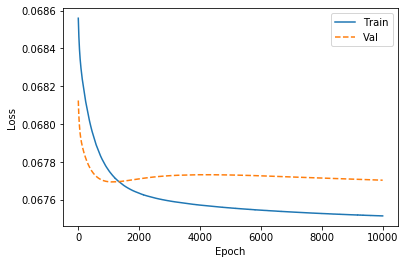

Loss on train dataset: 0.06751454139035382
Loss on validation dataset: 0.06770361727318622


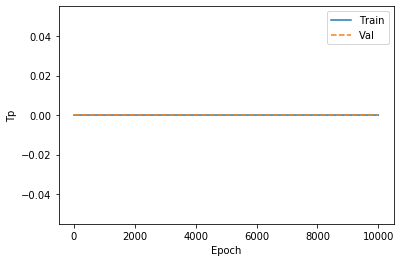

Tp on train dataset: 0.0
Tp on validation dataset: 0.0


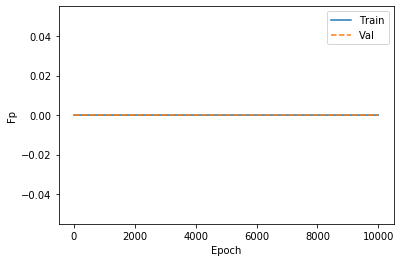

Fp on train dataset: 0.0
Fp on validation dataset: 0.0


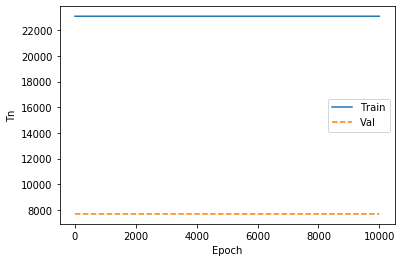

Tn on train dataset: 23089.0
Tn on validation dataset: 7697.0


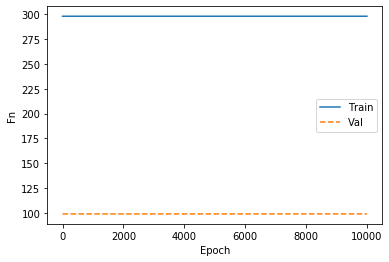

Fn on train dataset: 298.0
Fn on validation dataset: 99.0


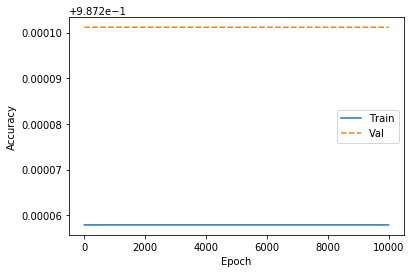

Accuracy on train dataset: 0.9872578978538513
Accuracy on validation dataset: 0.9873011708259583


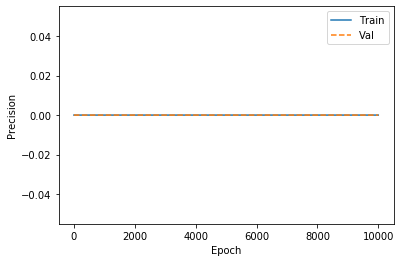

Precision on train dataset: 0.0
Precision on validation dataset: 0.0


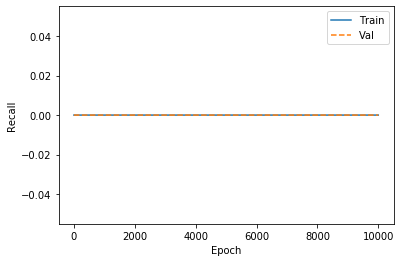

Recall on train dataset: 0.0
Recall on validation dataset: 0.0


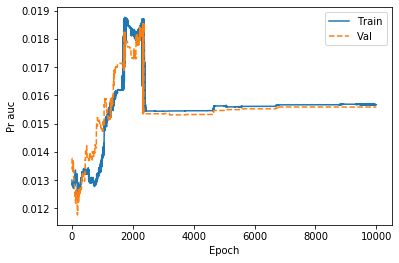

Pr auc on train dataset: 0.015671255066990852
Pr auc on validation dataset: 0.015587878413498402


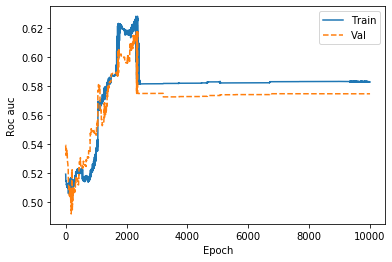

Roc auc on train dataset: 0.5829002857208252
Roc auc on validation dataset: 0.5747798681259155


In [13]:
# Metrics
print('Learning Curves for Metrics:')
plot_print_metrics(m_history, metrics_train=metrics_train, metrics_val=metrics_val, metrics_names=m.metrics_names)

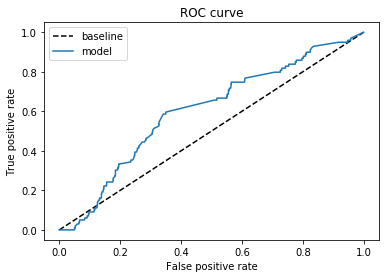

In [16]:
# ROC curve
plot_roc_curve(y_val, m_preds_val.ravel())

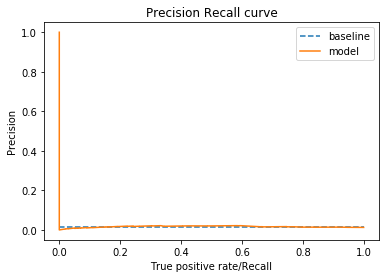

In [17]:
# Precision Recall curve
plot_pr_curve(y_val, m_preds_val.ravel())

In [20]:
# Saving the run's metrics
write_run_metrics('log_reg_model', hyperparameters, run_number, m.metrics_names, metrics_train, metrics_val)

### Logistic Regression Model using all Features

Since this model is just the same as the above model but with a larger input size (because it includes all the features) we will not be unit testing this model.

In [21]:
import os
import pickle
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

gpus = tf.config.experimental.list_physical_devices('GPU')
visible_gpus = tf.config.experimental.get_visible_devices('GPU')
print('GPUs: {}'.format(gpus))
print('Visible GPUs: {}'.format(visible_gpus))

if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=5000)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)      
        
# Setting Random Seed
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Visible GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Virtual devices cannot be modified after being initialized


In [22]:
def gen_print_model_stats(model, path, model_name):
    m = model()
    path = os.path.join(path, model_name)
    if not os.path.exists(path):
        os.makedirs(path)
    fname = os.path.join(path, model_name)
    tf.keras.utils.plot_model(m, fname + '.png', show_shapes=True, expand_nested=True)
    tf.keras.backend.clear_session()
    return m.summary()

Defining model.

In [23]:
def logistic_regression(output_kernel_init=None, output_bias_init=None):
    if output_bias_init is not None:
        output_bias_init = tf.keras.initializers.Constant(output_bias_init)
    inputs = tf.keras.Input(shape=(13,), name='input_features')
    outputs = tf.keras.layers.Dense(1, activation='sigmoid',
                                    kernel_initializer=output_kernel_init,
                                    bias_initializer=output_bias_init)(inputs)
    model = tf.keras.Model(inputs, outputs, name='logistic_regression_model')
    return model

gen_print_model_stats(logistic_regression, os.path.join('logs', 'models'), 'log_reg_full_model')

Model: "logistic_regression_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_features (InputLayer)  [(None, 13)]              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 14        
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________


Graph of Model:
![title](logs/models/log_reg_full_model/log_reg_full_model.png)

#### Evaluating Model

Restart kernel to clear GPU memory.

In [1]:
import os
import re
import pickle
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from sklearn.metrics import roc_curve, precision_recall_curve
from sklearn.model_selection import train_test_split

gpus = tf.config.experimental.list_physical_devices('GPU')
visible_gpus = tf.config.experimental.get_visible_devices('GPU')
print('GPUs: {}'.format(gpus))
print('Visible GPUs: {}'.format(visible_gpus))

if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=7000)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)      
        
# Setting Random Seed
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Visible GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
1 Physical GPUs, 1 Logical GPUs


In [4]:
with open('train_dataset_all_features.pickle', 'rb') as f:
    X, y = pickle.load(f)

In [5]:
def build_compiled_model(build_model, model_name, hparams, metrics, run_number):
    hparam_version = hparams['version']
    loss = hparams['loss']
    optimizer = hparams['optimizer']
    model_parameters = hparams['model_parameters']
    model = build_model(**model_parameters)
    path_to_ckpt = os.path.join('logs', 'models', model_name, '_'.join(['version', str(hparam_version)]),
                               'runs', str(run_number), 'checkpoints')
    if os.path.exists(path_to_ckpt):
        latest = tf.train.latest_checkpoint(path_to_ckpt)
        model.load_weights(latest)
        print('Restored model from: {}'.format(latest))  
    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    return model

In [6]:
def plot_errors(predictions, true_labels, title):
    fig, ax = plt.subplots()
    err = true_labels - predictions
    ax.plot(err, 'bo')
    ax.set_xlabel('Sample')
    ax.set_ylabel('Error')
    ax.set_title(title)
    plt.show()
    return None

def plot_metric(history, metric):
    name = metric.replace("_"," ").capitalize()
    fig, ax = plt.subplots()
    ax.plot(history.history[metric], label='Train')
    if 'val_' + metric in history.history:
        ax.plot(history.epoch, history.history['val_' + metric], linestyle="--", label='Val')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(name)
    ax.legend()
    plt.show()
    return None

def print_metric(metrics_values, metric_idx, name):
    if isinstance(metrics_values, list):
        metric_val = metrics_values[metric_idx]
    else: 
        metric_val = metrics_values
    return print(name.format(metric_val))
    
def plot_print_metrics(history, metrics_train, metrics_val, metrics_names):
    for metric_idx, metric_name in enumerate(metrics_names):
        if history != None:
            plot_metric(history, metric_name)
        name_train = metric_name.replace('_', ' ').capitalize() + ' on train dataset: {}'
        print_metric(metrics_train, metric_idx, name_train)
        name_val = metric_name.replace('_', ' ').capitalize() + ' on validation dataset: {}'
        print_metric(metrics_val, metric_idx, name_val)
    return None

def plot_roc_curve(labels, predictions):
    fpr, tpr, thresholds = roc_curve(y_val, predictions)
    fig, ax = plt.subplots()
    ax.plot([0, 1], [0, 1], 'k--', label='baseline')
    ax.plot(fpr, tpr, label='model')
    ax.set_xlabel('False positive rate')
    ax.set_ylabel('True positive rate')
    ax.set_title('ROC curve')
    plt.legend(loc='best')
    plt.show()
    return None

def plot_pr_curve(labels, predictions):
    precision, tpr, thresholds = precision_recall_curve(labels, predictions)
    baseline_prob = len(labels[labels==1]) / len(labels)
    fig, ax = plt.subplots()
    ax.plot([0, 1], [baseline_prob, baseline_prob], linestyle='--', label='baseline')
    ax.plot(tpr, precision, label='model')
    ax.set_xlabel('True positive rate/Recall')
    ax.set_ylabel('Precision')
    ax.set_title('Precision Recall curve')
    plt.legend(loc='best')
    plt.show()
    return None

In [7]:
def write_hparams(model_name, hparams, verbose=True):
    version_number = hparams['version']
    path = os.path.join('logs', 'models', model_name, '_'.join(['version', str(version_number)]))
    if not os.path.exists(path):
        os.makedirs(path)
    with open(os.path.join(path, 'hparams.pickle'), 'wb') as f:
        pickle.dump(hparams, f)
    if verbose:
        return print('Saved hyperparameters to file: {}'.format(path))
    else:
        return None
    
def write_run_metrics(model_name, hparams, run_number, metric_names, metrics_train, metrics_test):
    # Constructing path to dataframe
    version_number = hparams['version']
    path = os.path.join('logs', 'models', model_name, '_'.join(['version', str(version_number)]))
    if not os.path.exists(path):
        os.makedirs(path)
    # Loading/creating dataframe if none exists
    try:
        metrics_df = pd.read_csv(os.path.join(path, 'metrics.csv' ), index_col='run_number')
    except FileNotFoundError:
        cols = list(map(lambda name: '_'.join(['train', name]), metric_names)) + metric_names
        metrics_df = pd.DataFrame(columns=cols)
    # Adding information
    metrics_df.loc[run_number] = metrics_train + metrics_test
    # Writing dataframe to disk
    metrics_df.to_csv(os.path.join(path, 'metrics.csv'), index_label='run_number')
    return None

Defining model.

In [8]:
def logistic_regression(output_kernel_init=None, output_bias_init=None):
    if output_bias_init is not None:
        output_bias_init = tf.keras.initializers.Constant(output_bias_init)
    inputs = tf.keras.Input(shape=(13,), name='input_features')
    outputs = tf.keras.layers.Dense(1, activation='sigmoid',
                                    kernel_initializer=output_kernel_init,
                                    bias_initializer=output_bias_init)(inputs)
    model = tf.keras.Model(inputs, outputs, name='logistic_regression_model')
    return model

Splitting dataset into train and validation datasets.

In [9]:
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.75, random_state=seed, stratify=y)

print('Train set size: {}'.format(len(y_train)))
print('Validation set size: {}'.format(len(y_val)))

Train set size: 23312
Validation set size: 7771


Building model.

In [12]:
# Calculating Output Bias
p_0 = 529/41578
b = -np.log(((1 / p_0) - 1))

# Defining Hyperparameters
model_params = {'output_bias_init': b}
LOSS = tf.keras.losses.BinaryCrossentropy()
OPTIMIZER = tf.keras.optimizers.SGD()
training_params = {'batch_size': 512, 'epochs': 10000}
model_version = 0
hyperparameters = {'model_parameters': model_params, 'training_parameters': training_params,
                   'loss': LOSS, 'optimizer': OPTIMIZER, 'version': model_version}
write_hparams('log_reg_full_model', hyperparameters)

# Defining Metrics
METRICS = [tf.keras.metrics.TruePositives(name='TP'), tf.keras.metrics.FalsePositives(name='FP'),
           tf.keras.metrics.TrueNegatives(name='TN'), tf.keras.metrics.FalseNegatives(name='FN'),
           tf.keras.metrics.BinaryAccuracy(name='accuracy'), tf.keras.metrics.Precision(name='precision'),
           tf.keras.metrics.Recall(name='recall'), tf.keras.metrics.AUC(name='PR_AUC', curve='PR'),
           tf.keras.metrics.AUC(name='ROC_AUC', curve='ROC')]

# Run number
run_number = 0

Saved hyperparameters to file: logs/models/log_reg_full_model/version_0


In [13]:
m = build_compiled_model(logistic_regression, 'log_reg_full_model', hyperparameters, METRICS, run_number)

Training model.

In [14]:
training_parameters = hyperparameters['training_parameters']
m_history = m.fit(X_train, y_train, **training_parameters, validation_data=(X_val, y_val))

Train on 23312 samples, validate on 7771 samples
Epoch 1/10000
23312/23312 [==============================] - 2s 84us/sample - loss: 0.1444 - TP: 19.0000 - FP: 538.0000 - TN: 22476.0000 - FN: 279.0000 - accuracy: 0.9650 - precision: 0.0341 - recall: 0.0638 - PR_AUC: 0.0201 - ROC_AUC: 0.6178 - val_loss: 0.0763 - val_TP: 0.0000e+00 - val_FP: 3.0000 - val_TN: 7669.0000 - val_FN: 99.0000 - val_accuracy: 0.9869 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0237 - val_ROC_AUC: 0.6193
Epoch 2/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0719 - TP: 0.0000e+00 - FP: 6.0000 - TN: 23008.0000 - FN: 298.0000 - accuracy: 0.9870 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0260 - ROC_AUC: 0.6437 - val_loss: 0.0698 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0226 - val_ROC_AUC: 0.6311
Epoch 3/10000
23312/23312

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0664 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0259 - ROC_AUC: 0.6517 - val_loss: 0.0666 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0224 - val_ROC_AUC: 0.6401
Epoch 36/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0663 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0261 - ROC_AUC: 0.6528 - val_loss: 0.0666 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0223 - val_ROC_AUC: 0.6395
Epoch 37/10000
23312/23312 [==============================] - 0s 7us/sample

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0662 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0270 - ROC_AUC: 0.6534 - val_loss: 0.0664 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0230 - val_ROC_AUC: 0.6437
Epoch 70/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0662 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0267 - ROC_AUC: 0.6550 - val_loss: 0.0664 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0229 - val_ROC_AUC: 0.6437
Epoch 71/10000
23312/23312 [==============================] - 0s 7us/sample

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0661 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0273 - ROC_AUC: 0.6549 - val_loss: 0.0663 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0231 - val_ROC_AUC: 0.6502
Epoch 104/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0661 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0272 - ROC_AUC: 0.6567 - val_loss: 0.0663 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0233 - val_ROC_AUC: 0.6508
Epoch 105/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0660 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0269 - ROC_AUC: 0.6583 - val_loss: 0.0661 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0237 - val_ROC_AUC: 0.6528
Epoch 138/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0660 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0273 - ROC_AUC: 0.6562 - val_loss: 0.0661 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0238 - val_ROC_AUC: 0.6522
Epoch 139/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0660 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0272 - ROC_AUC: 0.6581 - val_loss: 0.0660 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0244 - val_ROC_AUC: 0.6590
Epoch 172/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0660 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0267 - ROC_AUC: 0.6567 - val_loss: 0.0660 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0245 - val_ROC_AUC: 0.6640
Epoch 173/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0659 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0274 - ROC_AUC: 0.6603 - val_loss: 0.0659 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0249 - val_ROC_AUC: 0.6668
Epoch 206/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0659 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0273 - ROC_AUC: 0.6612 - val_loss: 0.0659 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0250 - val_ROC_AUC: 0.6671
Epoch 207/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0658 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0279 - ROC_AUC: 0.6634 - val_loss: 0.0658 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0259 - val_ROC_AUC: 0.6793
Epoch 240/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0658 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0277 - ROC_AUC: 0.6642 - val_loss: 0.0658 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0258 - val_ROC_AUC: 0.6792
Epoch 241/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0658 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0273 - ROC_AUC: 0.6657 - val_loss: 0.0658 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0262 - val_ROC_AUC: 0.6779
Epoch 274/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0658 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0273 - ROC_AUC: 0.6646 - val_loss: 0.0658 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0261 - val_ROC_AUC: 0.6780
Epoch 275/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0657 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0278 - ROC_AUC: 0.6679 - val_loss: 0.0657 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0263 - val_ROC_AUC: 0.6807
Epoch 308/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0657 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0276 - ROC_AUC: 0.6688 - val_loss: 0.0657 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0265 - val_ROC_AUC: 0.6806
Epoch 309/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0657 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0277 - ROC_AUC: 0.6684 - val_loss: 0.0656 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0267 - val_ROC_AUC: 0.6861
Epoch 342/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0657 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0285 - ROC_AUC: 0.6702 - val_loss: 0.0656 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0264 - val_ROC_AUC: 0.6844
Epoch 343/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0656 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0280 - ROC_AUC: 0.6726 - val_loss: 0.0656 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0266 - val_ROC_AUC: 0.6840
Epoch 376/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0656 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0281 - ROC_AUC: 0.6720 - val_loss: 0.0656 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0266 - val_ROC_AUC: 0.6840
Epoch 377/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0656 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0281 - ROC_AUC: 0.6747 - val_loss: 0.0655 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0267 - val_ROC_AUC: 0.6854
Epoch 410/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0656 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0286 - ROC_AUC: 0.6771 - val_loss: 0.0655 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0267 - val_ROC_AUC: 0.6871
Epoch 411/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0655 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0284 - ROC_AUC: 0.6772 - val_loss: 0.0654 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0264 - val_ROC_AUC: 0.6886
Epoch 444/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0655 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0289 - ROC_AUC: 0.6780 - val_loss: 0.0654 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0267 - val_ROC_AUC: 0.6877
Epoch 445/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0655 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0288 - ROC_AUC: 0.6791 - val_loss: 0.0654 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0269 - val_ROC_AUC: 0.6892
Epoch 478/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0655 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0283 - ROC_AUC: 0.6795 - val_loss: 0.0654 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0267 - val_ROC_AUC: 0.6884
Epoch 479/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0655 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0287 - ROC_AUC: 0.6824 - val_loss: 0.0653 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0265 - val_ROC_AUC: 0.6874
Epoch 512/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0655 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0291 - ROC_AUC: 0.6811 - val_loss: 0.0653 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0266 - val_ROC_AUC: 0.6895
Epoch 513/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0654 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0291 - ROC_AUC: 0.6805 - val_loss: 0.0653 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0268 - val_ROC_AUC: 0.6900
Epoch 546/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0654 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0290 - ROC_AUC: 0.6811 - val_loss: 0.0653 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0268 - val_ROC_AUC: 0.6906
Epoch 547/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0654 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0290 - ROC_AUC: 0.6830 - val_loss: 0.0652 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0273 - val_ROC_AUC: 0.6949
Epoch 580/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0654 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0292 - ROC_AUC: 0.6829 - val_loss: 0.0652 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0271 - val_ROC_AUC: 0.6946
Epoch 581/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0654 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0294 - ROC_AUC: 0.6857 - val_loss: 0.0652 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0274 - val_ROC_AUC: 0.6924
Epoch 614/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0654 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0296 - ROC_AUC: 0.6849 - val_loss: 0.0652 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0275 - val_ROC_AUC: 0.6922
Epoch 615/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0653 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0301 - ROC_AUC: 0.6853 - val_loss: 0.0652 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0274 - val_ROC_AUC: 0.6968
Epoch 648/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0653 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0294 - ROC_AUC: 0.6864 - val_loss: 0.0652 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0276 - val_ROC_AUC: 0.6956
Epoch 649/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0653 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0296 - ROC_AUC: 0.6883 - val_loss: 0.0651 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0276 - val_ROC_AUC: 0.6972
Epoch 682/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0653 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0302 - ROC_AUC: 0.6856 - val_loss: 0.0651 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0280 - val_ROC_AUC: 0.6982
Epoch 683/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0653 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0296 - ROC_AUC: 0.6871 - val_loss: 0.0651 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0281 - val_ROC_AUC: 0.6990
Epoch 716/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0653 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0297 - ROC_AUC: 0.6865 - val_loss: 0.0651 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0281 - val_ROC_AUC: 0.6986
Epoch 717/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0653 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0297 - ROC_AUC: 0.6875 - val_loss: 0.0650 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0285 - val_ROC_AUC: 0.7041
Epoch 750/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0653 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0299 - ROC_AUC: 0.6883 - val_loss: 0.0650 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0287 - val_ROC_AUC: 0.7046
Epoch 751/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0652 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0303 - ROC_AUC: 0.6901 - val_loss: 0.0650 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0285 - val_ROC_AUC: 0.7053
Epoch 784/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0652 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0299 - ROC_AUC: 0.6884 - val_loss: 0.0650 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0286 - val_ROC_AUC: 0.7054
Epoch 785/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0652 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0304 - ROC_AUC: 0.6898 - val_loss: 0.0650 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0280 - val_ROC_AUC: 0.7077
Epoch 818/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0652 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0302 - ROC_AUC: 0.6890 - val_loss: 0.0650 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0282 - val_ROC_AUC: 0.7084
Epoch 819/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0652 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0301 - ROC_AUC: 0.6904 - val_loss: 0.0650 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0286 - val_ROC_AUC: 0.7069
Epoch 852/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0652 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0305 - ROC_AUC: 0.6908 - val_loss: 0.0650 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0282 - val_ROC_AUC: 0.7070
Epoch 853/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0652 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0302 - ROC_AUC: 0.6905 - val_loss: 0.0649 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0288 - val_ROC_AUC: 0.7076
Epoch 886/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0652 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0300 - ROC_AUC: 0.6910 - val_loss: 0.0649 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0286 - val_ROC_AUC: 0.7068
Epoch 887/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0302 - ROC_AUC: 0.6919 - val_loss: 0.0649 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0286 - val_ROC_AUC: 0.7068
Epoch 920/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0307 - ROC_AUC: 0.6919 - val_loss: 0.0649 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0287 - val_ROC_AUC: 0.7075
Epoch 921/10000
23312/23312 [==============================] - 0s 7us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0302 - ROC_AUC: 0.6926 - val_loss: 0.0649 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0288 - val_ROC_AUC: 0.7102
Epoch 954/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0307 - ROC_AUC: 0.6936 - val_loss: 0.0649 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0289 - val_ROC_AUC: 0.7102
Epoch 955/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0300 - ROC_AUC: 0.6936 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0288 - val_ROC_AUC: 0.7103
Epoch 988/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0307 - ROC_AUC: 0.6952 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0289 - val_ROC_AUC: 0.7101
Epoch 989/10000
23312/23312 [==============================] - 0s 8us/samp

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0304 - ROC_AUC: 0.6949 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0289 - val_ROC_AUC: 0.7117
Epoch 1022/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0303 - ROC_AUC: 0.6954 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7120
Epoch 1023/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0302 - ROC_AUC: 0.6960 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0285 - val_ROC_AUC: 0.7120
Epoch 1056/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0304 - ROC_AUC: 0.6968 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0287 - val_ROC_AUC: 0.7130
Epoch 1057/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0304 - ROC_AUC: 0.6950 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0287 - val_ROC_AUC: 0.7134
Epoch 1090/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0651 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0305 - ROC_AUC: 0.6953 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0288 - val_ROC_AUC: 0.7123
Epoch 1091/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0310 - ROC_AUC: 0.6955 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0289 - val_ROC_AUC: 0.7135
Epoch 1124/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0307 - ROC_AUC: 0.6957 - val_loss: 0.0648 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0287 - val_ROC_AUC: 0.7130
Epoch 1125/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.6964 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0283 - val_ROC_AUC: 0.7091
Epoch 1158/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0308 - ROC_AUC: 0.6984 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0283 - val_ROC_AUC: 0.7090
Epoch 1159/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0307 - ROC_AUC: 0.6970 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0285 - val_ROC_AUC: 0.7092
Epoch 1192/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0308 - ROC_AUC: 0.6995 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0284 - val_ROC_AUC: 0.7098
Epoch 1193/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0305 - ROC_AUC: 0.6983 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0284 - val_ROC_AUC: 0.7102
Epoch 1226/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0304 - ROC_AUC: 0.6954 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0285 - val_ROC_AUC: 0.7096
Epoch 1227/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0310 - ROC_AUC: 0.6988 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0287 - val_ROC_AUC: 0.7118
Epoch 1260/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0308 - ROC_AUC: 0.6958 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0286 - val_ROC_AUC: 0.7110
Epoch 1261/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0310 - ROC_AUC: 0.6991 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0286 - val_ROC_AUC: 0.7118
Epoch 1294/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0307 - ROC_AUC: 0.6986 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0285 - val_ROC_AUC: 0.7113
Epoch 1295/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0310 - ROC_AUC: 0.6998 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0287 - val_ROC_AUC: 0.7130
Epoch 1328/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0311 - ROC_AUC: 0.6994 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0286 - val_ROC_AUC: 0.7128
Epoch 1329/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0308 - ROC_AUC: 0.6971 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7138
Epoch 1362/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0311 - ROC_AUC: 0.6992 - val_loss: 0.0647 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0288 - val_ROC_AUC: 0.7140
Epoch 1363/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - ETA: 0s - loss: 0.0631 - TP: 0.0000e+00 - FP: 0.0000e+00 - TN: 17699.0000 - FN: 221.0000 - accuracy: 0.9877 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.69 - 0s 9us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0308 - ROC_AUC: 0.6983 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7152
Epoch 1396/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0650 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0309 - ROC_AUC: 0.6978 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - va

Epoch 1412/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0306 - ROC_AUC: 0.6986 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7138
Epoch 1413/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0309 - ROC_AUC: 0.6977 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7166
Epoch 1414/10000
23312/23312 [==========================

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0305 - ROC_AUC: 0.6997 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0289 - val_ROC_AUC: 0.7142
Epoch 1447/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0307 - ROC_AUC: 0.6976 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7162
Epoch 1448/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0309 - ROC_AUC: 0.6991 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7170
Epoch 1481/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0310 - ROC_AUC: 0.6992 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7163
Epoch 1482/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7005 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7139
Epoch 1515/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0307 - ROC_AUC: 0.7002 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7147
Epoch 1516/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0308 - ROC_AUC: 0.6998 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7133
Epoch 1549/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0309 - ROC_AUC: 0.7000 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7135
Epoch 1550/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7013 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7162
Epoch 1583/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7014 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7161
Epoch 1584/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0309 - ROC_AUC: 0.7018 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7169
Epoch 1617/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0311 - ROC_AUC: 0.7003 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7156
Epoch 1618/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7012 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7172
Epoch 1651/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0311 - ROC_AUC: 0.7017 - val_loss: 0.0646 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0301 - val_ROC_AUC: 0.7169
Epoch 1652/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7038 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7173
Epoch 1685/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7036 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7190
Epoch 1686/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0309 - ROC_AUC: 0.7014 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7175
Epoch 1719/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7028 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7170
Epoch 1720/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0311 - ROC_AUC: 0.7022 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7163
Epoch 1753/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7042 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7176
Epoch 1754/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0649 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7016 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7162
Epoch 1787/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7035 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7137
Epoch 1788/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7030 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7196
Epoch 1821/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0311 - ROC_AUC: 0.7031 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7172
Epoch 1822/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7036 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7103
Epoch 1855/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7037 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7102
Epoch 1856/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7041 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7116
Epoch 1889/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7034 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7123
Epoch 1890/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7057 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7128
Epoch 1923/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7044 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7124
Epoch 1924/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7045 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7119
Epoch 1957/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7036 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7122
Epoch 1958/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7048 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7158
Epoch 1991/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7038 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7133
Epoch 1992/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7021 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7160
Epoch 2025/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7044 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7164
Epoch 2026/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7031 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7132
Epoch 2059/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7040 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7160
Epoch 2060/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7046 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7137
Epoch 2093/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7028 - val_loss: 0.0645 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7131
Epoch 2094/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7049 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7139
Epoch 2127/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7036 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7139
Epoch 2128/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7043 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7128
Epoch 2161/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7047 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7128
Epoch 2162/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7031 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7194
Epoch 2195/10000
23312/23312 [==============================] - 0s 7us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7036 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7194
Epoch 2196/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7039 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7140
Epoch 2229/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7044 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7174
Epoch 2230/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7043 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7179
Epoch 2263/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7046 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7162
Epoch 2264/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7040 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7184
Epoch 2297/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7041 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7191
Epoch 2298/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7048 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7166
Epoch 2331/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7051 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7158
Epoch 2332/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7056 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7186
Epoch 2365/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0311 - ROC_AUC: 0.7044 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7182
Epoch 2366/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7063 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7169
Epoch 2399/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0648 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7051 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7164
Epoch 2400/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7053 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7187
Epoch 2433/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7044 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7169
Epoch 2434/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7063 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7166
Epoch 2467/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7061 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7168
Epoch 2468/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7048 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7168
Epoch 2501/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7047 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7139
Epoch 2502/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7048 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7138
Epoch 2535/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7060 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7135
Epoch 2536/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7055 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7126
Epoch 2569/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7064 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7133
Epoch 2570/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0311 - ROC_AUC: 0.7054 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0288 - val_ROC_AUC: 0.7123
Epoch 2603/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7066 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7126
Epoch 2604/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7066 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7130
Epoch 2637/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7074 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7128
Epoch 2638/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7063 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7160
Epoch 2671/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7078 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7159
Epoch 2672/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7080 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7138
Epoch 2705/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7094 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7139
Epoch 2706/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7088 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7144
Epoch 2739/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7094 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7141
Epoch 2740/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7089 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7167
Epoch 2773/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7090 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7133
Epoch 2774/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7097 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7135
Epoch 2807/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7092 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7142
Epoch 2808/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7089 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7142
Epoch 2841/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7097 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7197
Epoch 2842/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7095 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7155
Epoch 2875/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7112 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7169
Epoch 2876/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7107 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7196
Epoch 2909/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7111 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7194
Epoch 2910/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7104 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7171
Epoch 2943/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7105 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7175
Epoch 2944/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7105 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7175
Epoch 2977/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7118 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7201
Epoch 2978/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7102 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7201
Epoch 3011/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7101 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7151
Epoch 3012/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7115 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7184
Epoch 3045/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7107 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7199
Epoch 3046/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7092 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7125
Epoch 3079/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7106 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7117
Epoch 3080/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7106 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7146
Epoch 3113/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7112 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7180
Epoch 3114/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7117 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7145
Epoch 3147/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7105 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7126
Epoch 3148/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7122 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7152
Epoch 3181/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7105 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7150
Epoch 3182/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7111 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7147
Epoch 3215/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7128 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7151
Epoch 3216/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7132 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0289 - val_ROC_AUC: 0.7116
Epoch 3249/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7121 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7123
Epoch 3250/10000
23312/23312 [==============================] - 0s 8us/sa

Epoch 3282/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7120 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7196
Epoch 3283/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7133 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7220
Epoch 3284/10000
23312/23312 [==========================

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7125 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0288 - val_ROC_AUC: 0.7095
Epoch 3317/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7136 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0288 - val_ROC_AUC: 0.7096
Epoch 3318/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7105
Epoch 3351/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7118 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7106
Epoch 3352/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7124 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7108
Epoch 3385/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7108
Epoch 3386/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7132 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7099
Epoch 3419/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7126 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0289 - val_ROC_AUC: 0.7097
Epoch 3420/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7127
Epoch 3453/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7122 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0291 - val_ROC_AUC: 0.7129
Epoch 3454/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7117 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7126
Epoch 3487/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7127
Epoch 3488/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7197
Epoch 3521/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7149
Epoch 3522/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 7us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7178
Epoch 3555/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7125 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7183
Epoch 3556/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7132 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7125
Epoch 3589/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7133 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7127
Epoch 3590/10000
23312/23312 [==============================] - 0s 7us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7144
Epoch 3623/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7133 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7138
Epoch 3624/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7113 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7172
Epoch 3657/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7112 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7184
Epoch 3658/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7122
Epoch 3691/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7177
Epoch 3692/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0647 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7185
Epoch 3725/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7184
Epoch 3726/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7161
Epoch 3759/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7163
Epoch 3760/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7178
Epoch 3793/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7131 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7157
Epoch 3794/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7132 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7176
Epoch 3827/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7140 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7186
Epoch 3828/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7160
Epoch 3861/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7126 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7141
Epoch 3862/10000
23312/23312 [==============================] - 0s 8us/sa

Epoch 3894/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7162
Epoch 3895/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7169
Epoch 3896/10000
23312/23312 [==========================

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7163
Epoch 3929/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7186
Epoch 3930/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7152
Epoch 3963/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7155
Epoch 3964/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7138
Epoch 3997/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7146
Epoch 3998/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7150
Epoch 4031/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7140 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0290 - val_ROC_AUC: 0.7149
Epoch 4032/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7159
Epoch 4065/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7166
Epoch 4066/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7166
Epoch 4099/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7140 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7151
Epoch 4100/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7140 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0289 - val_ROC_AUC: 0.7154
Epoch 4133/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7159
Epoch 4134/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7132 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7152
Epoch 4167/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7168
Epoch 4168/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7155
Epoch 4201/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7131 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7153
Epoch 4202/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7152 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7178
Epoch 4235/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7152
Epoch 4236/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7179
Epoch 4269/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7151 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7162
Epoch 4270/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7177
Epoch 4303/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7174
Epoch 4304/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7148 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7154
Epoch 4337/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7160
Epoch 4338/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7161
Epoch 4371/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7161
Epoch 4372/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7145 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7182
Epoch 4405/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7126 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7179
Epoch 4406/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7157 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7169
Epoch 4439/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7161
Epoch 4440/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7149 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7170
Epoch 4473/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7152 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7179
Epoch 4474/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7145 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7177
Epoch 4507/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7176
Epoch 4508/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7163
Epoch 4541/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7124 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7158
Epoch 4542/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7150 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7158
Epoch 4575/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7161 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7162
Epoch 4576/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7150 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7161
Epoch 4609/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7131 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7180
Epoch 4610/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7159 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7179
Epoch 4643/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7153 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7177
Epoch 4644/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7148 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7158
Epoch 4677/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7154 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7171
Epoch 4678/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7149 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7181
Epoch 4711/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7160 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7181
Epoch 4712/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7158 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7186
Epoch 4745/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7159
Epoch 4746/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7148 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7162
Epoch 4779/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7186
Epoch 4780/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7184
Epoch 4813/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7150 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7184
Epoch 4814/10000
23312/23312 [==============================] - 0s 8us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7151 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7186
Epoch 4847/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7150 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7165
Epoch 4848/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7150 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7179
Epoch 4881/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7183
Epoch 4882/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7182
Epoch 4915/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7157
Epoch 4916/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7148 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7182
Epoch 4949/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7149 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7162
Epoch 4950/10000
23312/23312 [==============================] - 0s 9us/s

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7158
Epoch 4983/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7163
Epoch 4984/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7148 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7174
Epoch 5017/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7153 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7165
Epoch 5018/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7162
Epoch 5051/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7143
Epoch 5052/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7183
Epoch 5085/10000
23312/23312 [==============================] - 0s 8us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7151 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7176
Epoch 5086/10000
23312/23312 [==============================] - 0s 11us/s

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7152 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7145
Epoch 5119/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7138
Epoch 5120/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7139
Epoch 5153/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7145
Epoch 5154/10000
23312/23312 [==============================] - 0s 10us/s

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7142
Epoch 5187/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7149 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7140
Epoch 5188/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7159 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7150
Epoch 5221/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7147
Epoch 5222/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7156 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7177
Epoch 5255/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7177
Epoch 5256/10000
23312/23312 [==============================] - 0s 10us/s

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7177
Epoch 5289/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7169
Epoch 5290/10000
23312/23312 [==============================] - 0s 9us/s

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7155
Epoch 5323/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7151 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7163
Epoch 5324/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7150 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7145
Epoch 5357/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7154 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7141
Epoch 5358/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7133 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7160
Epoch 5391/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7156 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7141
Epoch 5392/10000
23312/23312 [==============================] - 0s 10us/s

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7161
Epoch 5425/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7158
Epoch 5426/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7131 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7173
Epoch 5459/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7160 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7181
Epoch 5460/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7160
Epoch 5493/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7168
Epoch 5494/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7149 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7141
Epoch 5527/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7164
Epoch 5528/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7158 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7147
Epoch 5561/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7152
Epoch 5562/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7147
Epoch 5595/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7124 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7143
Epoch 5596/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 14us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7165
Epoch 5629/10000
23312/23312 [==============================] - 0s 13us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7136 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7164
Epoch 5630/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7149 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7159
Epoch 5663/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7157 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7159
Epoch 5664/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7098 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7138
Epoch 5697/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7150
Epoch 5698/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7173
Epoch 5731/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7150 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7179
Epoch 5732/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7164 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7167
Epoch 5765/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7165
Epoch 5766/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7172
Epoch 5799/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7163
Epoch 5800/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7180
Epoch 5833/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7179
Epoch 5834/10000
23312/23312 [==============================] - 0s 9us/s

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7160 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7170
Epoch 5867/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7157
Epoch 5868/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7168
Epoch 5901/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7145 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7176
Epoch 5902/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 13us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7165
Epoch 5935/10000
23312/23312 [==============================] - 0s 12us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7154 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7174
Epoch 5936/10000
23312/23312 [==============================] - 0s 12us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7153 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7168
Epoch 5969/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7152 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7177
Epoch 5970/10000
23312/23312 [==============================] - 0s 9us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7170
Epoch 6003/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7166
Epoch 6004/10000
23312/23312 [==============================] - 0s 9us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7165
Epoch 6037/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7159
Epoch 6038/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7159
Epoch 6071/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7153 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7154
Epoch 6072/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 12us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7156 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7179
Epoch 6105/10000
23312/23312 [==============================] - 0s 12us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7178
Epoch 6106/10000
23312/23312 [==============================] - 0s 13us

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7175
Epoch 6139/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7179
Epoch 6140/10000
23312/23312 [==============================] - 0s 9us/sa

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7158
Epoch 6173/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7124 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7164
Epoch 6174/10000
23312/23312 [==============================] - 0s 9us/s

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7174
Epoch 6207/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7178
Epoch 6208/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7153 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7171
Epoch 6241/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7151 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7186
Epoch 6242/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7164
Epoch 6275/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7140 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7162
Epoch 6276/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7164
Epoch 6309/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7156
Epoch 6310/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7114 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7187
Epoch 6343/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7173
Epoch 6344/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7153 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7184
Epoch 6377/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7148 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7191
Epoch 6378/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7188
Epoch 6411/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7121 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7172
Epoch 6412/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7182
Epoch 6445/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7188
Epoch 6446/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7187
Epoch 6479/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7173
Epoch 6480/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7124 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7182
Epoch 6513/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7180
Epoch 6514/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7149 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7190
Epoch 6547/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7162
Epoch 6548/10000
23312/23312 [==============================] - 0s 9us/

23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7137 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7188
Epoch 6581/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7190
Epoch 6582/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7169
Epoch 6615/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7167
Epoch 6616/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7148 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7194
Epoch 6649/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7159 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7172
Epoch 6650/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7096 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7169
Epoch 6683/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0313 - ROC_AUC: 0.7117 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7182
Epoch 6684/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7140 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7185
Epoch 6717/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7145 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7190
Epoch 6718/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7178
Epoch 6751/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7140 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7183
Epoch 6752/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7192
Epoch 6785/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7168
Epoch 6786/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7188
Epoch 6819/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7190
Epoch 6820/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7145 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7187
Epoch 6853/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7125 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7184
Epoch 6854/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7131 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7169
Epoch 6887/10000
23312/23312 [==============================] - 0s 9us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7170
Epoch 6888/10000
23312/23312 [==============================] - 0s 10us/

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7136 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7182
Epoch 6921/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7150 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7186
Epoch 6922/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7176
Epoch 6955/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7183
Epoch 6956/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7169
Epoch 6989/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7151 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7180
Epoch 6990/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7152 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7191
Epoch 7023/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7152 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7192
Epoch 7024/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7190
Epoch 7057/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7173
Epoch 7058/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7136 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7164
Epoch 7091/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7189
Epoch 7092/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7132 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7187
Epoch 7125/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7136 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7188
Epoch 7126/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7171
Epoch 7159/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0323 - ROC_AUC: 0.7154 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7174
Epoch 7160/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7160 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7183
Epoch 7193/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7183
Epoch 7194/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7165 - val_loss: 0.0644 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7180
Epoch 7227/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7180
Epoch 7228/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7140 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7189
Epoch 7261/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7153 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7175
Epoch 7262/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7140 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7196
Epoch 7295/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7197
Epoch 7296/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0302 - val_ROC_AUC: 0.7192
Epoch 7329/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7159 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7195
Epoch 7330/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7155 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7170
Epoch 7363/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7198
Epoch 7364/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7192
Epoch 7397/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7173
Epoch 7398/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7129 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7179
Epoch 7431/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0312 - ROC_AUC: 0.7129 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0302 - val_ROC_AUC: 0.7194
Epoch 7432/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7170
Epoch 7465/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7153 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7183
Epoch 7466/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0323 - ROC_AUC: 0.7147 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7175
Epoch 7499/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0314 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7177
Epoch 7500/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7183
Epoch 7533/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7151 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7186
Epoch 7534/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7197
Epoch 7567/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0301 - val_ROC_AUC: 0.7190
Epoch 7568/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7132 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7191
Epoch 7601/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7172
Epoch 7602/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7193
Epoch 7635/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7111 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0301 - val_ROC_AUC: 0.7194
Epoch 7636/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 12us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7187
Epoch 7669/10000
23312/23312 [==============================] - 0s 12us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7146 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0301 - val_ROC_AUC: 0.7191
Epoch 7670/10000
23312/23312 [==============================] - 0s 12us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7126 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0302 - val_ROC_AUC: 0.7198
Epoch 7703/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0646 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7187
Epoch 7704/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0301 - val_ROC_AUC: 0.7193
Epoch 7737/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7131 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7183
Epoch 7738/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0301 - val_ROC_AUC: 0.7194
Epoch 7771/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7175
Epoch 7772/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7185
Epoch 7805/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7188
Epoch 7806/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7132 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7191
Epoch 7839/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7131 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7186
Epoch 7840/10000
23312/23312 [==============================] - 0s 9us/

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7191
Epoch 7873/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7168
Epoch 7874/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7136 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7188
Epoch 7907/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7161 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7195
Epoch 7908/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7189
Epoch 7941/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7190
Epoch 7942/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7189
Epoch 7975/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7188
Epoch 7976/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7145 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7170
Epoch 8009/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7129 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7167
Epoch 8010/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7144 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7192
Epoch 8043/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7187
Epoch 8044/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7216
Epoch 8077/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7138 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7210
Epoch 8078/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7129 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7184
Epoch 8111/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7141 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7186
Epoch 8112/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7142 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7213
Epoch 8145/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7122 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7213
Epoch 8146/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7183
Epoch 8179/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7176
Epoch 8180/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7182
Epoch 8213/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7185
Epoch 8214/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0323 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7181
Epoch 8247/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7126 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7190
Epoch 8248/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7120 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7183
Epoch 8281/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7221
Epoch 8282/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7135 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7185
Epoch 8315/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7115 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7183
Epoch 8316/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7116 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7184
Epoch 8349/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7181
Epoch 8350/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7187
Epoch 8383/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7106 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7194
Epoch 8384/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0323 - ROC_AUC: 0.7133 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0301 - val_ROC_AUC: 0.7222
Epoch 8417/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7108 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7217
Epoch 8418/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7125 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7168
Epoch 8451/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7103 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7189
Epoch 8452/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7194
Epoch 8485/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7141
Epoch 8486/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7112 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7184
Epoch 8519/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7113 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7190
Epoch 8520/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7121 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7189
Epoch 8553/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7142
Epoch 8554/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7117 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7218
Epoch 8587/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7131 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7164
Epoch 8588/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7112 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7142
Epoch 8621/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7164
Epoch 8622/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7115 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7186
Epoch 8655/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7187
Epoch 8656/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7143 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7192
Epoch 8689/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7108 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7207
Epoch 8690/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7134 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7210
Epoch 8723/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7212
Epoch 8724/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7212
Epoch 8757/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7126 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7206
Epoch 8758/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7125 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7189
Epoch 8791/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7104 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7182
Epoch 8792/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7120 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7168
Epoch 8825/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7115 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7172
Epoch 8826/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7106 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7170
Epoch 8859/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7106 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7165
Epoch 8860/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7111 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7167
Epoch 8893/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7174
Epoch 8894/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7107 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7165
Epoch 8927/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7166
Epoch 8928/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7163
Epoch 8961/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7167
Epoch 8962/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7122 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0302 - val_ROC_AUC: 0.7199
Epoch 8995/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7124 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7200
Epoch 8996/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7114 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7164
Epoch 9029/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7106 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7216
Epoch 9030/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7202
Epoch 9063/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7117 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7190
Epoch 9064/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 12us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7115 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7181
Epoch 9097/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7189
Epoch 9098/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 13us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7124 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7194
Epoch 9131/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7109 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7192
Epoch 9132/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 12us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7158 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7194
Epoch 9165/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7118 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7194
Epoch 9166/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7116 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7168
Epoch 9199/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7122 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7168
Epoch 9200/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7126 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7170
Epoch 9233/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7117 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7168
Epoch 9234/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7120 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7195
Epoch 9267/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7097 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7199
Epoch 9268/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7168
Epoch 9301/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7111 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7193
Epoch 9302/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7104 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7180
Epoch 9335/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0322 - ROC_AUC: 0.7126 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7185
Epoch 9336/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7139 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7169
Epoch 9369/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7114 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7162
Epoch 9370/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7110 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7212
Epoch 9403/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7119 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7160
Epoch 9404/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7099 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7173
Epoch 9437/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7109 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7169
Epoch 9438/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7104 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7204
Epoch 9471/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7106 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7189
Epoch 9472/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7115 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0298 - val_ROC_AUC: 0.7200
Epoch 9505/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7130 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7182
Epoch 9506/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7103 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7167
Epoch 9539/10000
23312/23312 [==============================] - 0s 12us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7118 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7163
Epoch 9540/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7120 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7196
Epoch 9573/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7111 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0299 - val_ROC_AUC: 0.7195
Epoch 9574/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7126 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7191
Epoch 9607/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7110 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7182
Epoch 9608/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7132 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7190
Epoch 9641/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7107 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7188
Epoch 9642/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0315 - ROC_AUC: 0.7112 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7169
Epoch 9675/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7112 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7197
Epoch 9676/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7100 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0300 - val_ROC_AUC: 0.7199
Epoch 9709/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7128 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7191
Epoch 9710/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7115 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7191
Epoch 9743/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0317 - ROC_AUC: 0.7116 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7189
Epoch 9744/10000
23312/23312 [==============================] - 0s 10us

23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0292 - val_ROC_AUC: 0.7159
Epoch 9777/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7127 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7185
Epoch 9778/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7113 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7189
Epoch 9811/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0321 - ROC_AUC: 0.7125 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0297 - val_ROC_AUC: 0.7193
Epoch 9812/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7107 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0293 - val_ROC_AUC: 0.7183
Epoch 9845/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7120 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7188
Epoch 9846/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0316 - ROC_AUC: 0.7116 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7184
Epoch 9879/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7145 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7185
Epoch 9880/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7124 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7183
Epoch 9913/10000
23312/23312 [==============================] - 0s 10us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7123 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0296 - val_ROC_AUC: 0.7190
Epoch 9914/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7115 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7187
Epoch 9947/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0318 - ROC_AUC: 0.7129 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0295 - val_ROC_AUC: 0.7188
Epoch 9948/10000
23312/23312 [==============================] - 0s 11us

23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0320 - ROC_AUC: 0.7140 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7186
Epoch 9981/10000
23312/23312 [==============================] - 0s 11us/sample - loss: 0.0645 - TP: 0.0000e+00 - FP: 1.0000 - TN: 23013.0000 - FN: 298.0000 - accuracy: 0.9872 - precision: 0.0000e+00 - recall: 0.0000e+00 - PR_AUC: 0.0319 - ROC_AUC: 0.7117 - val_loss: 0.0643 - val_TP: 0.0000e+00 - val_FP: 0.0000e+00 - val_TN: 7672.0000 - val_FN: 99.0000 - val_accuracy: 0.9873 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_PR_AUC: 0.0294 - val_ROC_AUC: 0.7185
Epoch 9982/10000
23312/23312 [==============================] - 0s 11us

Evaluating model.

In [15]:
# Gathering Data
metrics_train = m.evaluate(X_train, y_train, batch_size=training_parameters['batch_size'], verbose=0)
metrics_val = m.evaluate(X_val, y_val, batch_size=training_parameters['batch_size'], verbose=0)
m_preds_train = m.predict(X_train, batch_size=training_parameters['batch_size'])
m_preds_val = m.predict(X_val, batch_size=training_parameters['batch_size'])

Learning Curves for Metrics:


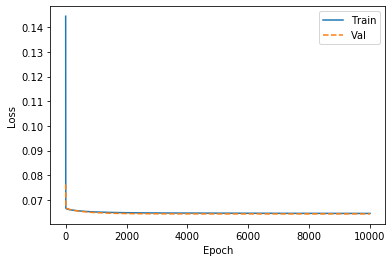

Loss on train dataset: 0.06450199011608437
Loss on validation dataset: 0.06433012931827102


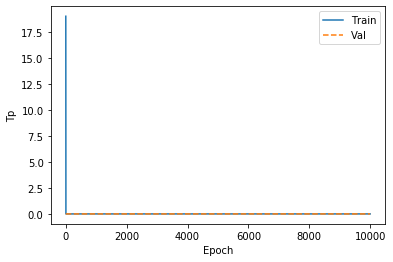

Tp on train dataset: 0.0
Tp on validation dataset: 0.0


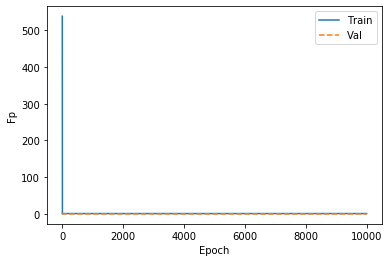

Fp on train dataset: 1.0
Fp on validation dataset: 0.0


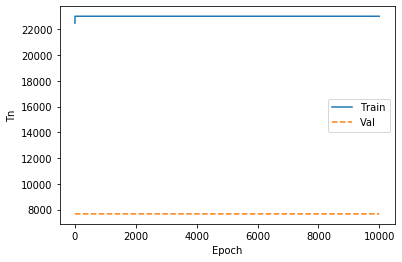

Tn on train dataset: 23013.0
Tn on validation dataset: 7672.0


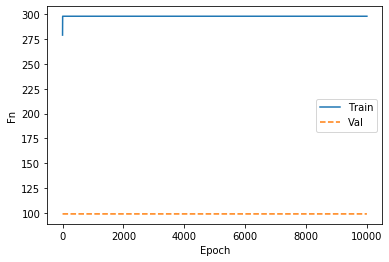

Fn on train dataset: 298.0
Fn on validation dataset: 99.0


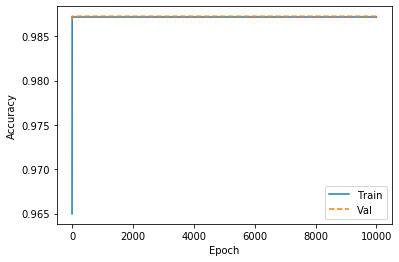

Accuracy on train dataset: 0.9871739745140076
Accuracy on validation dataset: 0.9872603416442871


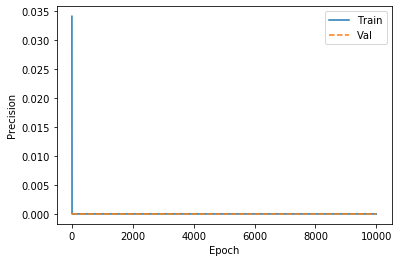

Precision on train dataset: 0.0
Precision on validation dataset: 0.0


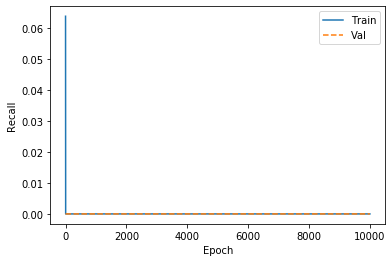

Recall on train dataset: 0.0
Recall on validation dataset: 0.0


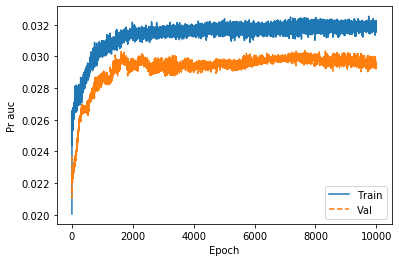

Pr auc on train dataset: 0.03209972754120827
Pr auc on validation dataset: 0.029438568279147148


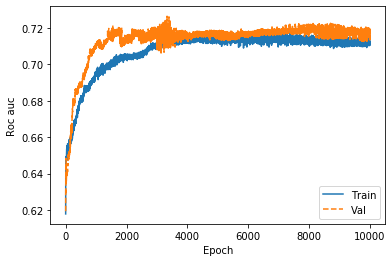

Roc auc on train dataset: 0.7139043211936951
Roc auc on validation dataset: 0.7185363173484802


In [16]:
# Metrics
print('Learning Curves for Metrics:')
plot_print_metrics(m_history, metrics_train=metrics_train, metrics_val=metrics_val, metrics_names=m.metrics_names)

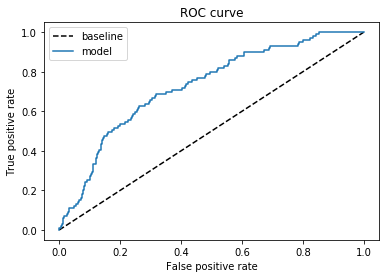

In [17]:
# ROC curve
plot_roc_curve(y_val, m_preds_val.ravel())

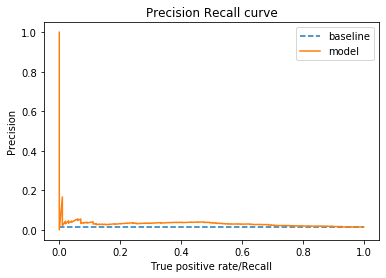

In [18]:
# Precision Recall curve
plot_pr_curve(y_val, m_preds_val.ravel())

In [26]:
# Saving the run's metrics
write_run_metrics('log_reg_full_model', hyperparameters, run_number, m.metrics_names, metrics_train, metrics_val)

#### Conclusions

After experimenting with both logistic regression models, it appears the model that uses all variables as features performs the best in all metrics including the area under precision recall curve (PR_AUC). PR_AUC was chosen as the most important metric for this experiment because as a company ultimate wants to be able to gain better insight into what factors lead to rider retention. Since ultimate wants to ultimately increase rider retention, having a model that accurately predicts true positives (rider is retained), is more preferable than a model that can accurately predict true negatives (rider is not retained), or both. A model that fits the above requirements will be able to give ultimate more insight into what variables correlate with riders being retained. Thus maximizing both precision and recall of retained status is the goal. Area under the precison recall curve was chosen as opposed to F1 score because it gives us a good summary of the performance of all the model variants that arise from varying the probability threshold, as opposed to just one model variant. Although the model using the full set of features performs the best on PR_AUC, it still performs only slightly better (about 2x better) than the baseline model. In order to increase performance (for future note) we can try varying the hyperparameters of the better model. Specifically the learning rate, since it appears from the learning curves that varying epochs will not increase the performance much since the slopes have flattened out, and both the curves for the training metrics and validation metrics have converged. We can also try a decision tree model since decision trees are also easily interpretable. Alternatively we can try a deeper model with more variance, although we would be sacrificing the ease of interpetting the beta coefficents of the logistics regression model for better performance on our metrics. 